In [1]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import json
import xarray as xr
import rioxarray as rxr
import rasterio as rio
from rasterio.enums import ColorInterp
from rasterio.plot import show
import contextily as cx
import numpy as np
# from geocube.api.core import make_geocube
# from geocube.rasterize import rasterize_points_griddata
import matplotlib.animation as animation
# %matplotlib widget
from scipy import signal

from matplotlib.colors import Normalize, BoundaryNorm
import matplotlib.cm as cm
# import datetime
from datetime import datetime, timedelta
import geojson
import netCDF4
from geojson import Feature, FeatureCollection, dump
from shapely.geometry import Polygon, MultiPolygon, LineString

from insar4sm.prep_meteo import convert_to_df


In [2]:
ssm_path = Path("malawi/SSM/malawi_InSAR_SSM_1km_southern_20230101_20240531")
gdf = gpd.read_file(ssm_path/"sm_inversions_malawi_InSAR_SSM_1km_southern_20230101_20230531_500.shp")
polys = gpd.read_file(ssm_path/"malawi_InSAR_SSM_1km_southern_20230101_20240531/INSAR4SM_processing/SM/SM_polygons.geojson")
gdf = gdf.drop(columns="geometry")
gdf = pd.concat([polys, gdf], axis=1)


# ims = []
# fig, ax = plt.subplots()
# for col in gdf.columns[1:]:
#     im = gdf.plot(column = col, ax=ax, animated=True)
#     ims.append([im])

# ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
#                                 repeat_delay=1000)

In [88]:
modis = rio.open("/data/tapasnas/malawi/modis/VIs/MODIS_VIs_16D_Malawi/2024_05_24.tif") #("/data/tapas/pearse/malawi/MODIS/2024_04_22.tif")
modis_rgb = rio.open("/data/tapas/pearse/malawi/MODIS/MODIS_context.tif")


In [2]:
with open("/data/tapas/pearse/malawi/sentinel1/aoi/geoBoundaries-MWI-ADM0.geojson") as gj:
    mpoly = geojson.load(gj)

multimpoly = []
for coords in mpoly['features'][0]['geometry']['coordinates']:
    poly = Polygon(coords[0])
    multimpoly.append(poly)
multimpoly = MultiPolygon(multimpoly)



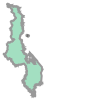

In [37]:
multimpoly

In [31]:
mpoly['features'][0]['geometry']['coordinates'][0]

[[[34.712917, -12.136228],
  [34.725832, -12.133899],
  [34.73014, -12.132377],
  [34.738557, -12.126428],
  [34.745844, -12.11459],
  [34.749949, -12.11062],
  [34.757328, -12.10757],
  [34.762964, -12.100319],
  [34.768532, -12.093252],
  [34.770721, -12.090183],
  [34.778145, -12.084639],
  [34.782333, -12.08145],
  [34.782603, -12.079016],
  [34.782674, -12.076824],
  [34.782654, -12.076113],
  [34.782961, -12.075131],
  [34.783263, -12.074824],
  [34.784638, -12.072925],
  [34.785131, -12.072218],
  [34.786306, -12.070355],
  [34.786669, -12.069719],
  [34.788028, -12.067588],
  [34.78931, -12.065185],
  [34.78969, -12.064582],
  [34.790739, -12.062647],
  [34.791657, -12.060649],
  [34.792384, -12.05878],
  [34.793289, -12.055966],
  [34.793794, -12.053829],
  [34.794155, -12.051665],
  [34.794372, -12.049482],
  [34.79444, -12.046885],
  [34.794366, -12.04486],
  [34.794146, -12.042678],
  [34.793781, -12.040514],
  [34.793274, -12.038378],
  [34.792625, -12.03628],
  [34.791729

In [5]:
with rio.open("/data/tapas/pearse/malawi/MODIS/MODIS_context.tif", "r+") as modis_rgb:
    modis_rgb.colorinterp = [ColorInterp.red, ColorInterp.green, ColorInterp.blue]
    modis_masked, modis_transform = rio.mask.mask(modis_rgb, [mpoly], nodata=-999)
    print(modis_rgb.crs.to_string())

EPSG:4326


RuntimeError: In affine_transform: Invalid vertices array.

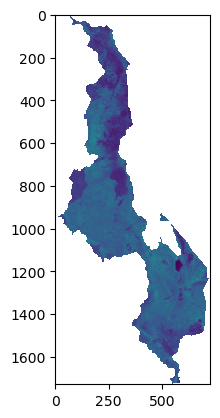

In [71]:
fig, ax = plt.subplots(1,1,)# transform=modis_transform)
ax.imshow(modis_masked[0])
ax.transAxes.transform(modis_transform)


In [7]:
modis_masked[modis_masked==-999] = 255

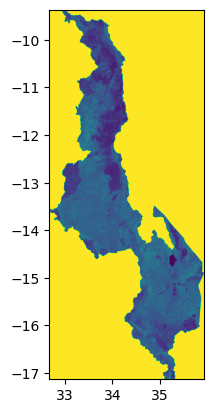

<AxesSubplot:>

In [9]:

show(modis_masked[0], transform=modis_transform)

TypeError: Cannot convert fill_value nan to dtype int16

In [46]:
modis.profile

{'driver': 'GTiff', 'dtype': 'float64', 'nodata': None, 'width': 1561, 'height': 3731, 'count': 2, 'crs': CRS.from_epsg(4326), 'transform': Affine(0.0020810044729198136, 0.0, 32.671770224841076,
       0.0, -0.0020810044729198136, -9.36660113261208), 'blockxsize': 256, 'blockysize': 256, 'tiled': True, 'compress': 'lzw', 'interleave': 'pixel'}

In [36]:
modis_masked_ma = np.ma.masked_where(modis_masked[0] == -999, modis_masked[0])

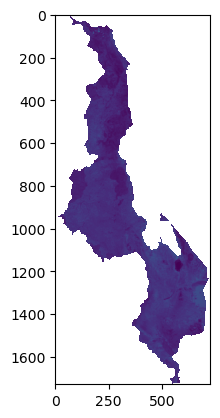

In [44]:
plt.imshow(modis_masked_ma[2])


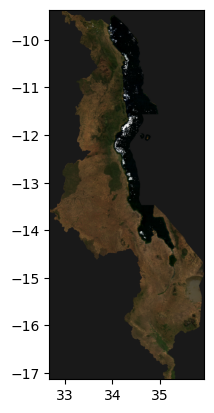

<AxesSubplot:>

In [55]:
show(modis_rgb)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


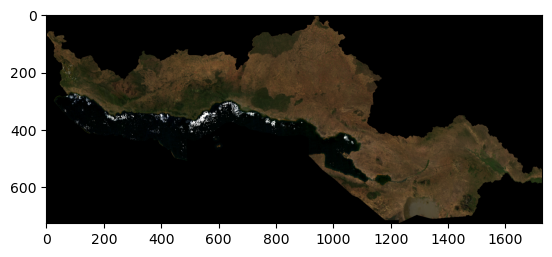

In [158]:
plt.imshow(modis_rgb.read().T)

In [91]:
modis.crs, modis_rgb.crs

(CRS.from_epsg(4326), CRS.from_epsg(4326))

In [92]:
modis.read(1), modis_rgb.read(1)

(array([[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]),
 array([[-999, -999, -999, ..., -999, -999, -999],
        [-999, -999, -999, ..., -999, -999, -999],
        [-999, -999, -999, ..., -999, -999, -999],
        ...,
        [-999, -999, -999, ..., -999, -999, -999],
        [-999, -999, -999, ..., -999, -999, -999],
        [-999, -999, -999, ..., -999, -999, -999]], dtype=int16))

In [120]:
modis_rgb.colorinterp[0]

<enum 'ColorInterp'>

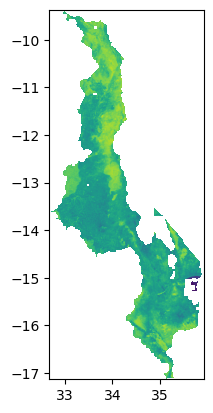

<AxesSubplot:>

In [93]:
show( 
    modis 
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


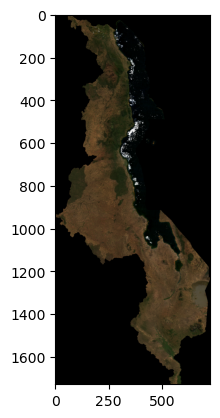

<AxesSubplot:>

In [106]:
show(modis_rgb)


In [37]:
from rasterio.plot import show

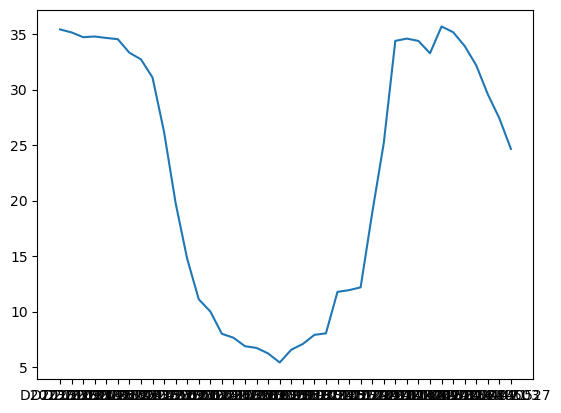

In [5]:
plt.plot(gdf.mean(numeric_only=True))

In [6]:
cx.providers

{'OpenStreetMap': {'Mapnik': {'url': 'https://tile.openstreetmap.org/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap contributors',
   'name': 'OpenStreetMap.Mapnik'},
  'DE': {'url': 'https://tile.openstreetmap.de/{z}/{x}/{y}.png',
   'max_zoom': 18,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap contributors',
   'name': 'OpenStreetMap.DE'},
  'CH': {'url': 'https://tile.osm.ch/switzerland/{z}/{x}/{y}.png',
   'max_zoom': 18,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap contributors',
   'bounds': [[45, 5], [48, 11]],
   'name': 'OpenStreetMap.CH'},
  'France': {'url': 'https://{s}.tile.openstreetmap.fr/osmfr/{z}/{x}/{y}.png',
   'max_zoom': 20,
   'html_attribution': '&copy; OpenStreetMap France | &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap France | (C) OpenStreetMap contributors',
   'name': 'OpenStreetMap.France'},
  'HOT': {'url': 'https://{s}.tile.openstreetmap.fr/hot/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles style by <a href="https://www.hotosm.org/" target="_blank">Humanitarian OpenStreetMap Team</a> hosted by <a href="https://openstreetmap.fr/" target="_blank">OpenStreetMap France</a>',
   'attribution': '(C) OpenStreetMap contributors, Tiles style by Humanitarian OpenStreetMap Team hosted by OpenStreetMap France',
   'name': 'OpenStreetMap.HOT'},
  'BZH': {'url': 'https://tile.openstreetmap.bzh/br/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles courtesy of <a href="http://www.openstreetmap.bzh/" target="_blank">Breton OpenStreetMap Team</a>',
   'attribution': '(C) OpenStreetMap contributors, Tiles courtesy of Breton OpenStreetMap Team',
   'bounds': [[46.2, -5.5], [50, 0.7]],
   'name': 'OpenStreetMap.BZH'},
  'BlackAndWhite': {'url': 'http://{s}.tiles.wmflabs.org/bw-mapnik/{z}/{x}/{y}.png',
   'max_zoom': 18,
   'attribution': '(C) OpenStreetMap contributors',
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'name': 'OpenStreetMap.BlackAndWhite'}},
 'MapTilesAPI': {'OSMEnglish': {'url': 'https://maptiles.p.rapidapi.com/{variant}/{z}/{x}/{y}.png?rapidapi-key={apikey}',
   'html_attribution': '&copy; <a href="http://www.maptilesapi.com/">MapTiles API</a>, &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) MapTiles API, (C) OpenStreetMap contributors',
   'variant': 'en/map/v1',
   'apikey': '<insert your api key here>',
   'max_zoom': 19,
   'name': 'MapTilesAPI.OSMEnglish'},
  'OSMFrancais': {'url': 'https://maptiles.p.rapidapi.com/{variant}/{z}/{x}/{y}.png?rapidapi-key={apikey}',
   'html_attribution': '&copy; <a href="http://www.maptilesapi.com/">MapTiles API</a>, &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) MapTiles API, (C) OpenStreetMap contributors',
   'variant': 'fr/map/v1',
   'apikey': '<insert your api key here>',
   'max_zoom': 19,
   'name': 'MapTilesAPI.OSMFrancais'},
  'OSMEspagnol': {'url': 'https://maptiles.p.rapidapi.com/{variant}/{z}/{x}/{y}.png?rapidapi-key={apikey}',
   'html_attribution': '&copy; <a href="http://www.maptilesapi.com/">MapTiles API</a>, &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) MapTiles API, (C) OpenStreetMap contributors',
   'variant': 'es/map/v1',
   'apikey': '<insert 

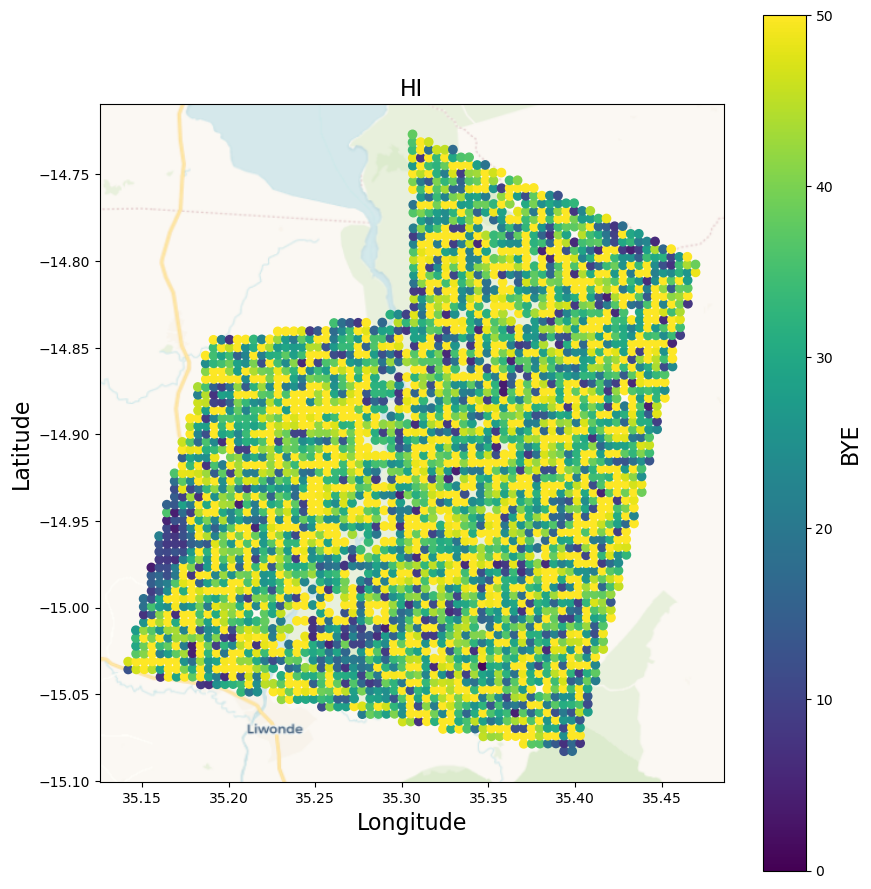

In [7]:
fig,ax = plt.subplots(1,1,figsize=(9,9))
cmap="viridis"
normalizer = Normalize(0, 50)
im = cm.ScalarMappable(norm=normalizer, cmap=cmap)
gax = gdf.plot(column=gdf.columns[1], ax=ax, legend=False, cmap=cmap, norm=normalizer)
cb = fig.colorbar(im, ax=ax)
cb.set_label(label="BYE",size=16)
ax.set_title("HI", fontdict={"size":16})
ax.set_ylabel("Latitude", fontdict={"size":16})
ax.set_xlabel("Longitude", fontdict={"size":16})
cx.add_basemap(gax, crs=gdf.crs.to_string(), source=cx.providers.CartoDB.Voyager(attribution=""))

plt.tight_layout()

In [4]:
SAR_dates = pd.to_datetime(gdf.columns[:-1], format="D%Y%m%d")

In [13]:
gdf.columns[1:30], gdf.columns[30:]

(Index(['D20230109', 'D20230121', 'D20230214', 'D20230226', 'D20230310',
        'D20230322', 'D20230403', 'D20230415', 'D20230427', 'D20230509',
        'D20230521', 'D20230602', 'D20230614', 'D20230626', 'D20230708',
        'D20230720', 'D20230801', 'D20230813', 'D20230825', 'D20230906',
        'D20230918', 'D20230930', 'D20231024', 'D20231105', 'D20231117',
        'D20231129', 'D20231211', 'D20231223', 'D20240104'],
       dtype='object'),
 Index(['D20240116', 'D20240128', 'D20240209', 'D20240221', 'D20240304',
        'D20240316', 'D20240328', 'D20240409', 'D20240421', 'D20240503',
        'D20240527'],
       dtype='object'))

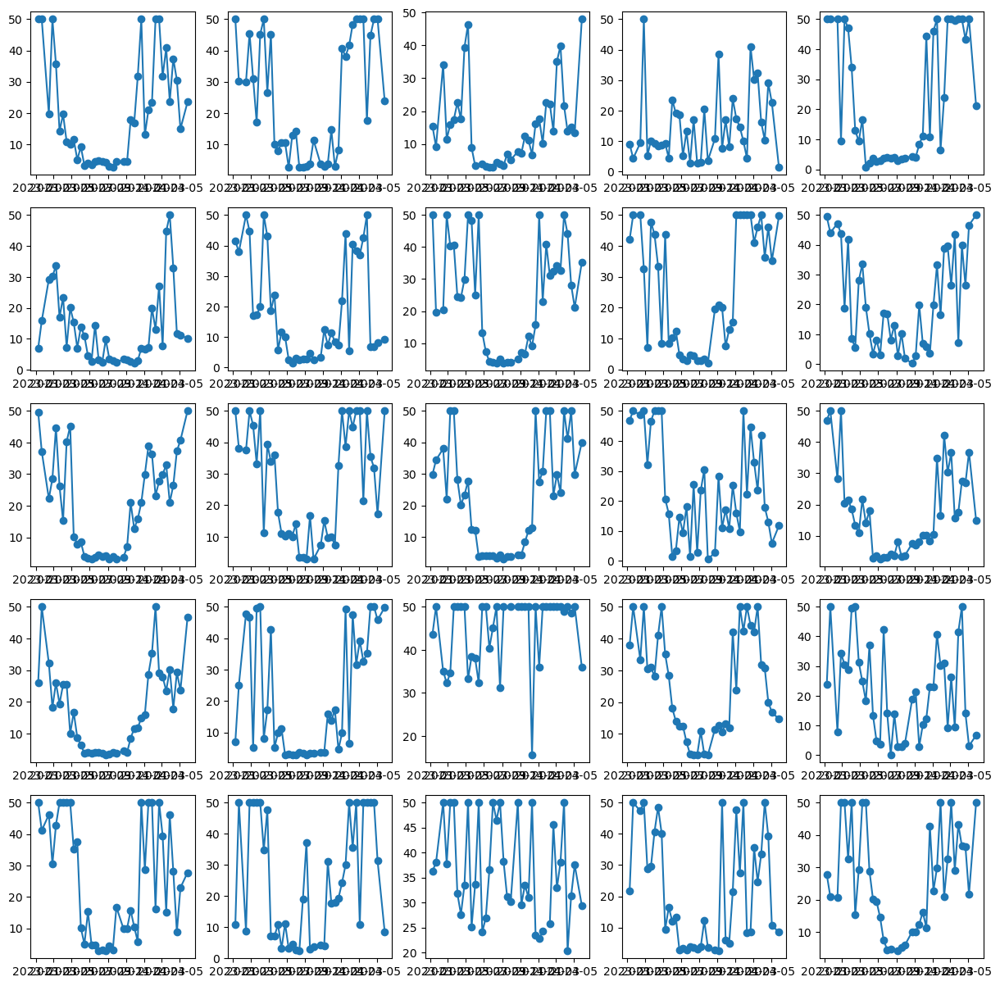

In [5]:
gdf_sample = gdf.sample(25, random_state=42)
fig, axs = plt.subplots(5,5, figsize=(15,15))
for i, ax in enumerate(axs.ravel()):
    ax.plot(SAR_dates,gdf_sample[gdf.columns[:-1]].iloc[i].values, '-o')

In [34]:
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance

In [54]:
t_series = gdf[gdf.columns[:-1]].dropna().values
t_series = TimeSeriesScalerMeanVariance().fit_transform(t_series)
n_clusters = 5
dba_km = TimeSeriesKMeans(n_clusters=n_clusters,
                          n_init=1,
                          metric="softdtw",
                          n_jobs=32,
                          verbose=True,
                          max_iter_barycenter=10,
                          random_state=42)
t_clusters = dba_km.fit_predict(t_series)

1386.919 --> 1995.853 --> 2004.954 --> 2007.796 --> 2009.326 --> 2010.575 --> 2012.521 --> 2014.004 --> 2015.364 --> 2016.229 --> 2017.279 --> 2018.386 --> 2019.529 --> 2020.701 --> 2021.420 --> 2022.038 --> 2022.460 --> 2022.951 --> 2023.298 --> 2023.603 --> 2024.009 --> 2024.385 --> 2024.647 --> 2024.948 --> 2025.000 --> 2025.196 --> 2025.222 --> 2025.320 --> 2025.309 --> 2025.328 --> 2025.369 --> 2025.380 --> 2025.385 --> 2025.373 --> 2025.423 --> 2025.401 --> 2025.459 --> 2025.428 --> 2025.422 --> 2025.422 --> 2025.417 --> 2025.399 --> 2025.413 --> 2025.409 --> 2025.419 --> 2025.412 --> 2025.422 --> 2025.422 --> 2025.426 --> 2025.421 --> 


In [55]:
t_series.shape, t_clusters.shape


((3088, 40, 1), (3088,))

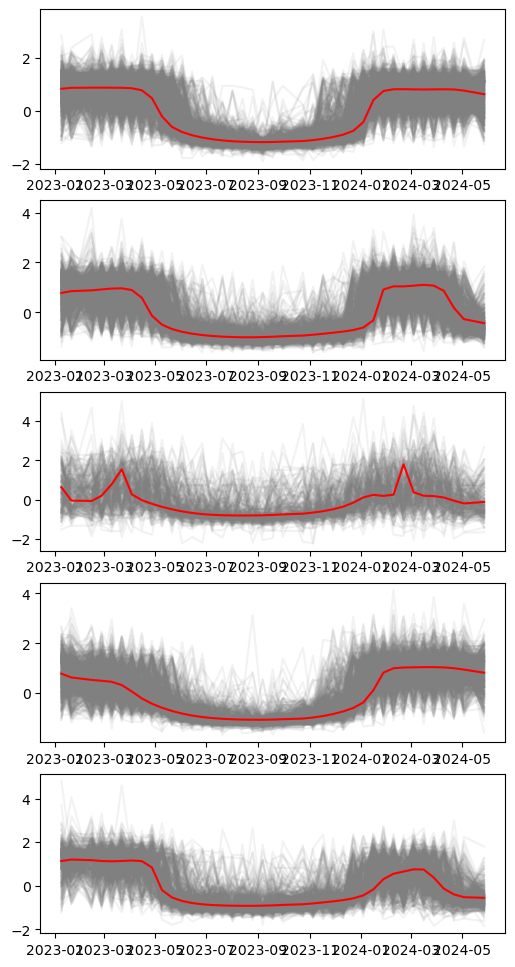

In [56]:
fig, axs = plt.subplots(n_clusters,1,figsize=(6,12))
for i in range(n_clusters):
    axs[i].plot(SAR_dates, t_series[:,:,0][t_clusters==i].T, color='grey', alpha=0.1)
    axs[i].plot(SAR_dates, dba_km.cluster_centers_[i].ravel(), "r-")



In [57]:
cluster_df = gdf.dropna()
cluster_df['cluster'] = t_clusters

/data/tapas/pearse/miniconda3/envs/insar4sm_dev/lib/python3.9/site-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


<AxesSubplot:>

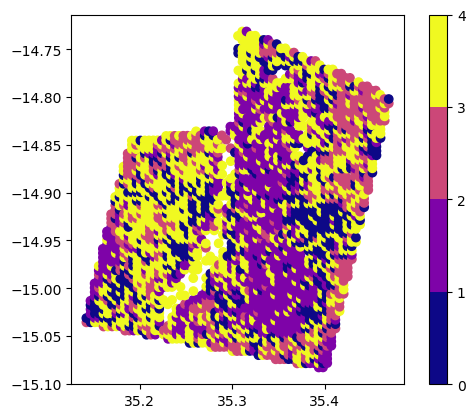

In [49]:
cmap = cm.get_cmap("plasma", n_clusters)
bounds = np.arange(n_clusters)
norm = BoundaryNorm(bounds, cmap.N)

cluster_df.plot("cluster", cmap=cmap, norm=norm , legend=True)#cm.get_cmap('magma', 10))

Text(0.5, 1.0, 'DTW')

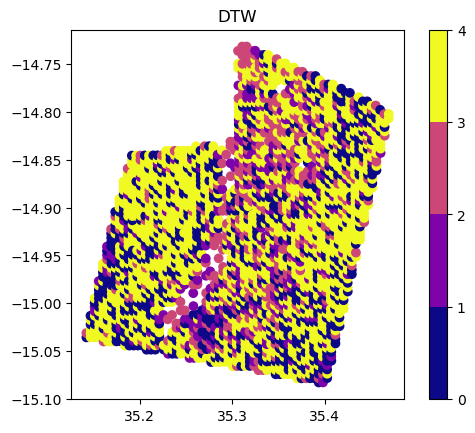

In [53]:
cmap = cm.get_cmap("plasma", n_clusters)
bounds = np.arange(n_clusters)
norm = BoundaryNorm(bounds, cmap.N)
cluster_df.plot("cluster", cmap=cmap, norm=norm , legend=True)
plt.title("DTW")

Text(0.5, 1.0, 'Soft-DTW')

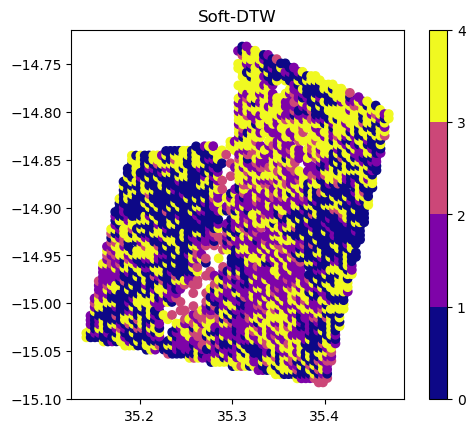

In [58]:
cmap = cm.get_cmap("plasma", n_clusters)
bounds = np.arange(n_clusters)
norm = BoundaryNorm(bounds, cmap.N)
cluster_df.plot("cluster", cmap=cmap, norm=norm , legend=True)
plt.title("Soft-DTW")

In [409]:
modis_files = sorted(list(Path("/data/tapasnas/malawi/modis/VIs/MODIS_VIs_16D_Malawi").glob("*tif")))[-33:]
chirp_files = list(Path("/data/tapasnas/malawi/chirps/CHIRPS_16D_sums_Malawi").glob("*tif"))[-33:]
modis_files

[PosixPath('/data/tapasnas/malawi/modis/VIs/MODIS_VIs_16D_Malawi/2023_01_01.tif'),
 PosixPath('/data/tapasnas/malawi/modis/VIs/MODIS_VIs_16D_Malawi/2023_01_17.tif'),
 PosixPath('/data/tapasnas/malawi/modis/VIs/MODIS_VIs_16D_Malawi/2023_02_02.tif'),
 PosixPath('/data/tapasnas/malawi/modis/VIs/MODIS_VIs_16D_Malawi/2023_02_18.tif'),
 PosixPath('/data/tapasnas/malawi/modis/VIs/MODIS_VIs_16D_Malawi/2023_03_06.tif'),
 PosixPath('/data/tapasnas/malawi/modis/VIs/MODIS_VIs_16D_Malawi/2023_03_22.tif'),
 PosixPath('/data/tapasnas/malawi/modis/VIs/MODIS_VIs_16D_Malawi/2023_04_07.tif'),
 PosixPath('/data/tapasnas/malawi/modis/VIs/MODIS_VIs_16D_Malawi/2023_04_23.tif'),
 PosixPath('/data/tapasnas/malawi/modis/VIs/MODIS_VIs_16D_Malawi/2023_05_09.tif'),
 PosixPath('/data/tapasnas/malawi/modis/VIs/MODIS_VIs_16D_Malawi/2023_05_25.tif'),
 PosixPath('/data/tapasnas/malawi/modis/VIs/MODIS_VIs_16D_Malawi/2023_06_10.tif'),
 PosixPath('/data/tapasnas/malawi/modis/VIs/MODIS_VIs_16D_Malawi/2023_06_26.tif'),
 Pos

datetime.datetime(2024, 5, 24, 0, 0)

In [425]:
modis_rxr.expand_dims?

Signature:
modis_rxr.expand_dims(
    dim: 'None | Hashable | Sequence[Hashable] | Mapping[Any, Any]' = None,
    axis=None,
    **dim_kwargs: 'Any',
) -> 'DataArray'
Docstring:
Return a new object with an additional axis (or axes) inserted at
the corresponding position in the array shape. The new object is a
view into the underlying array, not a copy.

If dim is already a scalar coordinate, it will be promoted to a 1D
coordinate consisting of a single value.

Parameters
----------
dim : hashable, sequence of hashable, dict, or None, optional
    Dimensions to include on the new variable.
    If provided as str or sequence of str, then dimensions are inserted
    with length 1. If provided as a dict, then the keys are the new
    dimensions and the values are either integers (giving the length of
    the new dimensions) or sequence/ndarray (giving the coordinates of
    the new dimensions).
axis : int, list of int or tuple of int, or None, default: None
    Axis position(s) where new a

In [426]:
modis_rxrs = []
for modis_file in modis_files:
    modis_date = datetime.strptime(modis_file.stem, "%Y_%m_%d")
    modis_rxr = rxr.open_rasterio(modis_file, masked=False)
    modis_rxr = modis_rxr.assign_coords(time=modis_date)
    modis_rxr = modis_rxr.expand_dims(dim="time")
    modis_rxrs.append(modis_rxr)

modis_rxr_merge = xr.combine_by_coords(modis_rxrs)

In [451]:
from pyproj import Transformer
lat, lon = gdf.geometry[0].y,  gdf.geometry[0].x

In [489]:
lats, lons = gdf.geometry.y.values,  gdf.geometry.x.values

In [521]:
ndvi_merge = modis_rxr_merge[:,0]
transformer = Transformer.from_crs("EPSG:4326", ndvi_merge.rio.crs, always_xy=True)
xx, yy = transformer.transform(lons, lats)

# get value from grid
value = ndvi_merge.sel(x=xx, y=yy, method="nearest").values

In [1]:
value.shape

NameError: name 'value' is not defined

In [508]:
value[np.isnan(value)] = 0

In [511]:
cor = signal.correlate(value, gdf[gdf.columns[:-1]].values/100)

ValueError: in1 and in2 should have the same dimensionality

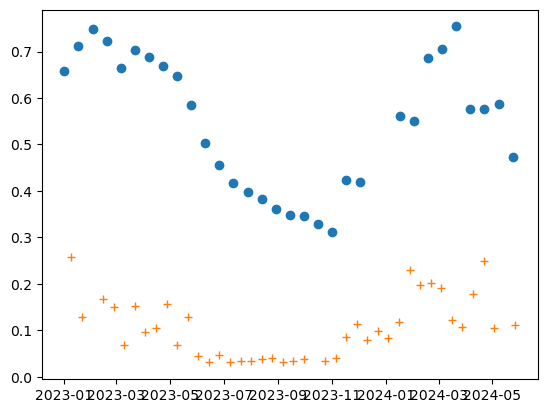

In [479]:
plt.plot(ndvi_merge.time[~np.isnan(value)], value[~np.isnan(value)], 'o')
plt.plot(SAR_dates, gdf[gdf.columns[:-1]].loc[0]/100, '+')

In [478]:
value[~np.isnan(value)], (gdf[gdf.columns[:-1]].loc[0]/100).values


(array([0.6582, 0.7122, 0.7492, 0.7235, 0.6652, 0.703 , 0.6892, 0.6698,
        0.6483, 0.5859, 0.5037, 0.4561, 0.4173, 0.3986, 0.3831, 0.3614,
        0.3492, 0.3465, 0.3294, 0.3113, 0.4226, 0.4201, 0.562 , 0.5511,
        0.685 , 0.7065, 0.7539, 0.5762, 0.5762, 0.5866, 0.4723]),
 array([0.25789618, 0.12864452, 0.16670722, 0.15017562, 0.06904482,
        0.15297278, 0.09663643, 0.10534997, 0.1574161 , 0.06857637,
        0.12864509, 0.04480647, 0.03282598, 0.04610646, 0.03281807,
        0.03437353, 0.03398424, 0.03889169, 0.0396814 , 0.03086573,
        0.0339672 , 0.03792765, 0.03498463, 0.03987748, 0.08522135,
        0.11285036, 0.07964318, 0.09836195, 0.08251018, 0.11887985,
        0.22965311, 0.19724599, 0.20166914, 0.19054929, 0.1230108 ,
        0.10657843, 0.17884131, 0.24863395, 0.1042068 , 0.1117021 ]))

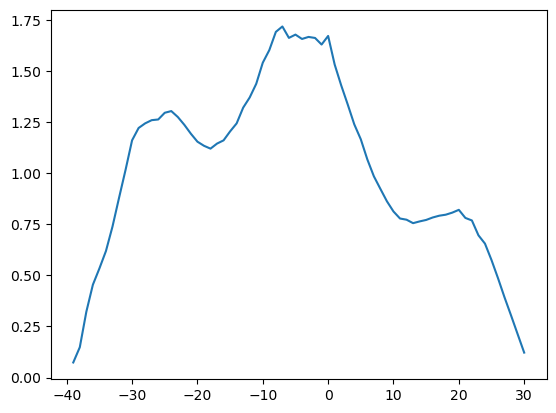

In [483]:
cor = signal.correlate(value[~np.isnan(value)], gdf[gdf.columns[:-1]].loc[0]/100)
lag = signal.correlation_lags(len(value[~np.isnan(value)]), len(gdf[gdf.columns[:-1]].loc[0]))
plt.plot(lag, cor)

In [484]:
signal.

AttributeError: module 'scipy.signal' has no attribute 'auto'

In [75]:
modis_path = Path("/data/tapasnas/malawi/modis/VIs/MODIS_VIs_16D_Malawi")
modis_files = []
for SAR_date in SAR_dates:
    modis_file = modis_path/SAR_date.date().strftime("%Y_%m_%d.tif")
    modis_files.append(modis_file.as_posix())

In [255]:
rio = rxr.open_rasterio(modis_files[5], masked=False)
# chirp = rxr.open_rasterio(chirp_files[5])

In [226]:
ndvi = rio[0]
ndvi.attrs['long_name'] = "NDVI"

In [361]:
cube = make_geocube(gdf, like=clipped_ndvi, rasterize_function=rasterize_points_griddata, interpolate_na_method=None)
clipped_cube = cube.rio.clip([aoi_poly["features"][0]["geometry"]])

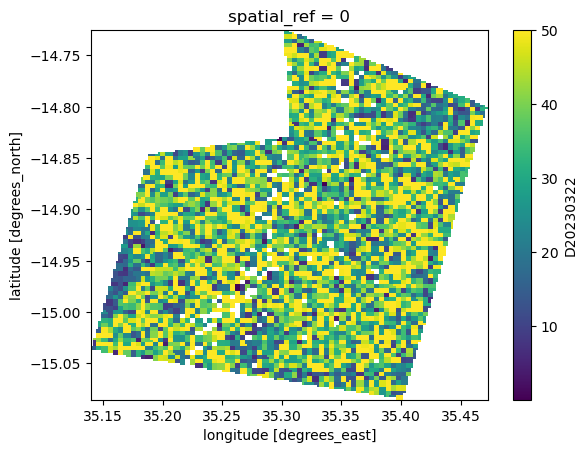

In [362]:
clipped_cube.D20230322.plot()

In [400]:
clipped_ndvi.fillna(clipped_ndvi.mean())

<xarray.DataArray (y: 173, x: 160)>
array([[0.69955457, 0.69955457, 0.69955457, ..., 0.69955457, 0.69955457,
        0.69955457],
       [0.69955457, 0.69955457, 0.69955457, ..., 0.69955457, 0.69955457,
        0.69955457],
       [0.69955457, 0.69955457, 0.69955457, ..., 0.69955457, 0.69955457,
        0.69955457],
       ...,
       [0.69955457, 0.69955457, 0.69955457, ..., 0.69955457, 0.69955457,
        0.69955457],
       [0.69955457, 0.69955457, 0.69955457, ..., 0.69955457, 0.69955457,
        0.69955457],
       [0.69955457, 0.69955457, 0.69955457, ..., 0.69955457, 0.69955457,
        0.69955457]])
Coordinates:
  * y            (y) float64 -14.73 -14.73 -14.73 ... -15.08 -15.08 -15.08
  * x            (x) float64 35.14 35.14 35.15 35.15 ... 35.47 35.47 35.47 35.47
    band         int64 1
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:  Area
    scale_factor:   1.0
    add_offset:     0.0
    long_name:      NDVI

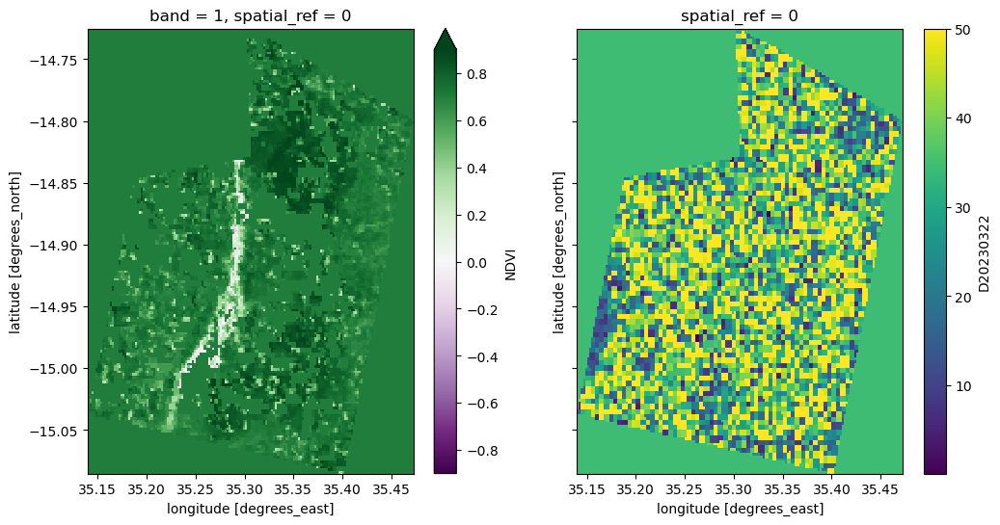

In [401]:
clipped_ndvi = ndvi.rio.clip([aoi_poly["features"][0]["geometry"]])
fig, ax = plt.subplots(1,2, figsize=(12,6),sharex=True, sharey=True)
clipped_ndvi.fillna(clipped_ndvi.mean()).plot(ax=ax[0], cmap="PRGn", vmin=-0.9, vmax=0.9)
clipped_cube.D20230322.fillna(clipped_cube.D20230322.mean()).plot(ax=ax[1])



In [468]:
from scipy.signal import correlate, correlate2d
cor = correlate2d(clipped_cube.D20230322.fillna(clipped_cube.D20230322.mean()), clipped_ndvi.fillna(clipped_ndvi.mean()))

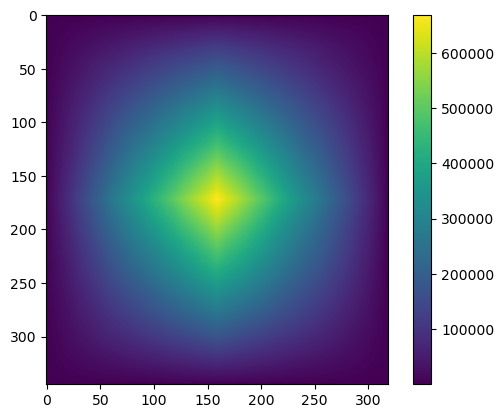

In [469]:
plt.imshow(cor)
plt.colorbar()

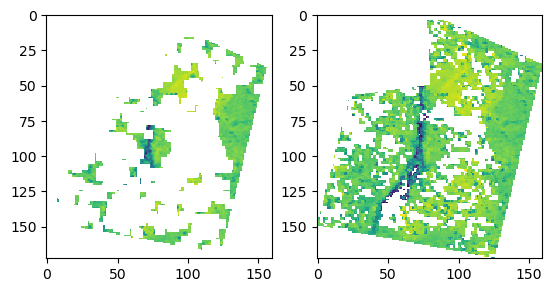

In [303]:
fig, ax = plt.subplots(1,2)
ax[0].imshow(clipped_ndvi, interpolation="spline36")
ax[1].imshow(clipped_ndvi, interpolation="none")

In [197]:
import geojson
with open("/data/tapas/pearse/malawi/sentinel1/aoi/southern_malawi_aoi.geojson") as gj:
    aoi_poly = geojson.load(gj)


In [205]:
aoi_poly["features"][0]["geometry"]

{"coordinates": [[[35.1398, -15.037], [35.4017, -15.0851], [35.4723, -14.7994], [35.3422, -14.7404], [35.302, -14.7249], [35.3069, -14.8289], [35.188, -14.846], [35.1398, -15.037]]], "type": "Polygon"}

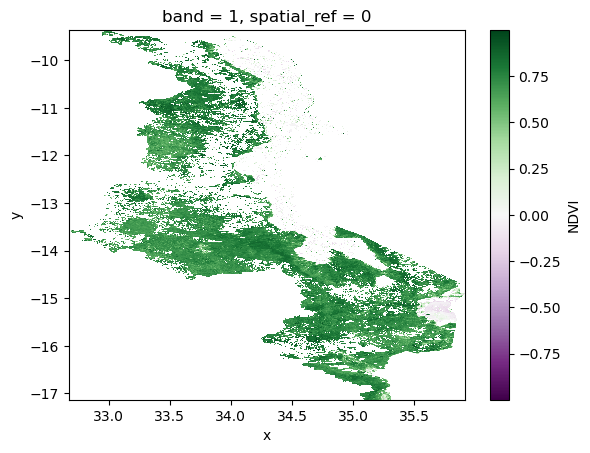

In [235]:
ndvi.attrs['long_name'] = "NDVI"
ndvi.plot(cmap="PRGn")

In [243]:
ndvi.x

<xarray.DataArray 'x' (x: 1561)>
array([32.672811, 32.674892, 32.676973, ..., 35.915016, 35.917097, 35.919178])
Coordinates:
    band         int64 1
  * x            (x) float64 32.67 32.67 32.68 32.68 ... 35.91 35.92 35.92 35.92
    spatial_ref  int64 0

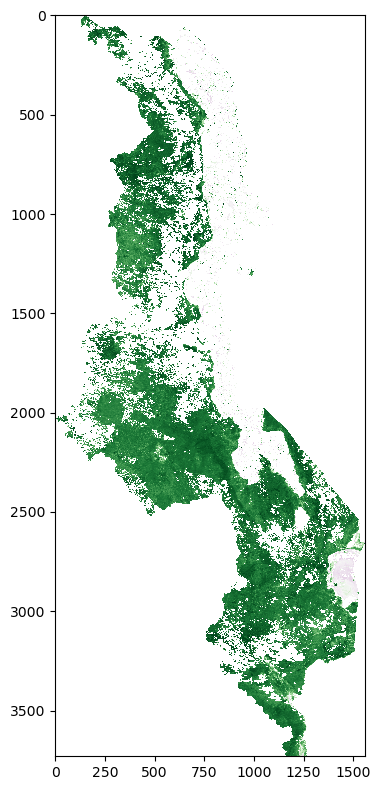

In [288]:
plt.figure(figsize=(4, 12))
plt.imshow(ndvi, aspect= "equal", cmap="PRGn", vmin=-0.9, vmax=0.9, interpolation="none")


# plt.pcolormesh(ndvi.x, ndvi.y, ndvi,  cmap="PRGn", vmin=-0.9, vmax=0.9)
# # plt.colorbar()
# plt.gca().set_aspect('equal')

In [237]:
type(ndvi)

xarray.core.dataarray.DataArray

In [137]:
import rasterio
from rasterio.plot import show

In [231]:
src = rasterio.open(modis_files[5])

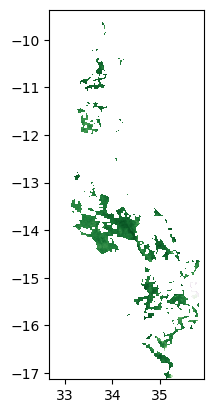

In [233]:
im = show((src,1),cmap="PRGn", vmin=-0.9, vmax=0.9)
# plt.colorbar(im)


In [12]:
cluster_df['cluster']

0       1
1       9
2       0
3       3
4       9
       ..
3500    2
3501    0
3502    2
3504    2
3505    0
Name: cluster, Length: 3088, dtype: int64

In [14]:
def persistence_transform(gdf):
    persistence_dict = {}
    persistence_dict['geometry'] = gdf['geometry']
    for date in gdf.columns[1:]:
        col_index = np.where(gdf.columns == date)[0][0]
        persistence = gdf[gdf.columns[1:col_index+1]].min(axis=1)
        persistence_dict[date] = persistence
    
    persistence_df = gpd.GeoDataFrame(persistence_dict)
    return persistence_df

In [15]:
persistence_df = persistence_transform(gdf)

In [16]:
RPD = persistence_df[persistence_df.columns[2:]].values  - persistence_df[persistence_df.columns[1:-1]].values

RPD_col_names = [d1 + '-' + d0 for d1, d0 in zip(persistence_df.columns[2:], persistence_df.columns[1:-1])]
RPD_dict = {col_name: value for col_name, value in zip(RPD_col_names, RPD.T)}
RPD_df = pd.DataFrame(RPD_dict)
RPD_gdf = pd.concat([polys, RPD_df], axis=1)
# plt.figure()
# RPD_gdf.plot(RPD_col_names[0], cmap="PuOr", legend=True)

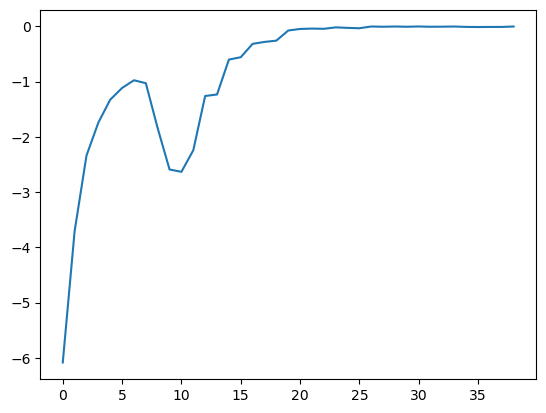

In [20]:
plt.plot(np.arange(39),RPD_df.mean())

In [5]:
RD = gdf[gdf.columns[2:]].values  - gdf[gdf.columns[1:-1]].values

RD_col_names = [d1 + '-' + d0 for d1, d0 in zip(gdf.columns[2:], gdf.columns[1:-1])]

RD_dict = {col_name: value for col_name, value in zip(RD_col_names, RD.T)}
RD_df = pd.DataFrame(RD_dict)
RD_gdf = pd.concat([polys, RD_df], axis=1)


# plt.figure()
# RD_gdf.plot(RD_col_names[0], cmap="PuOr", legend=True)

In [95]:
BD = gdf[gdf.columns[2:]].values  - gdf[gdf.columns[1]].values[:, np.newaxis]

BD_col_names = [d1 + '-D20230109' for d1 in gdf.columns[2:]]
BD_dict = {col_name: value for col_name, value in zip(BD_col_names, BD.T)}
BD_df = pd.DataFrame(BD_dict)
BD_gdf = pd.concat([polys, BD_df], axis=1)

# plt.figure()
# BD_gdf.plot(BD_col_names[0], cmap="PuOr", legend=True)

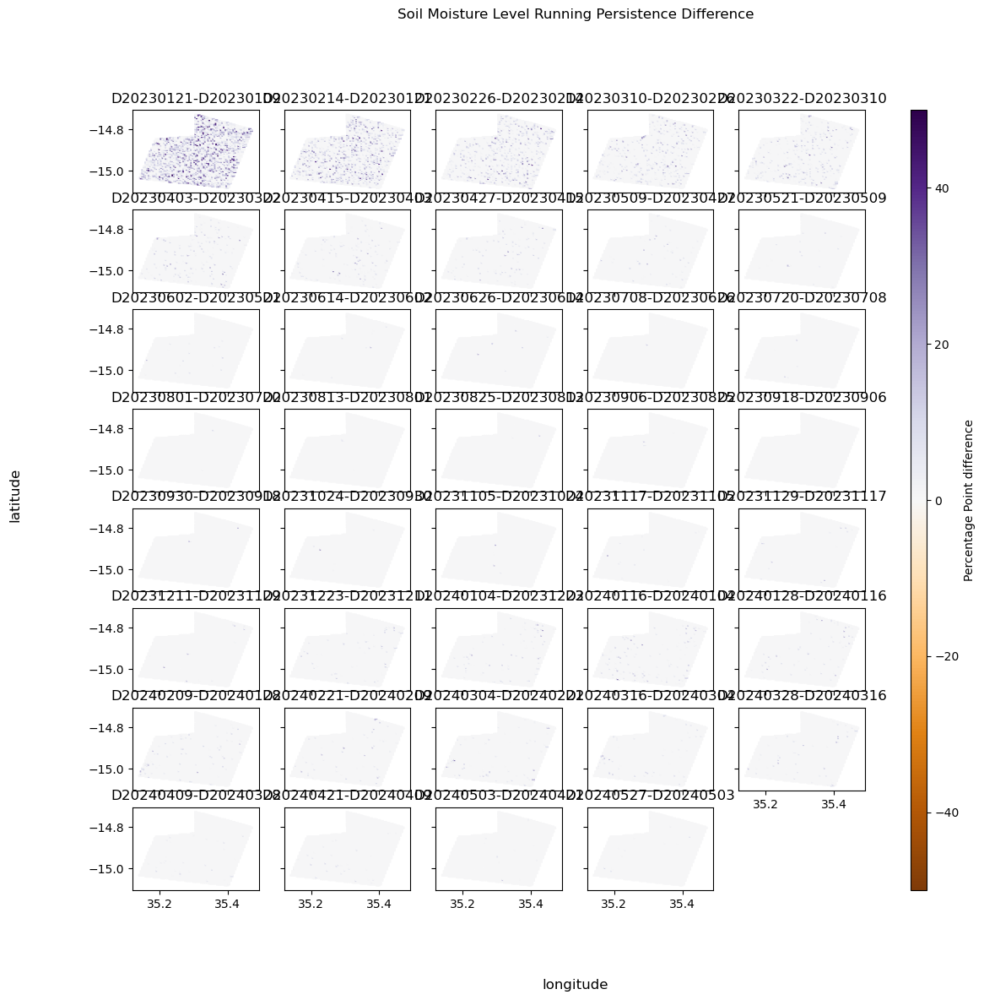

In [11]:
cmap = cm.get_cmap('PuOr')
normalizer = Normalize(-50, 50)
im = cm.ScalarMappable(norm=normalizer, cmap=cmap)

fig, axs = plt.subplots(8,5, figsize=(14, 12), sharex=True, sharey=True)
for i, ax in enumerate(np.ravel(axs)[:-1]):
    col = RPD_gdf.columns[1+i]
    RPD_gdf.plot(ax=ax, column = col, legend=False, cmap=cmap, norm=normalizer, aspect=None)
    # col_date = datetime.strptime(col, "D%Y%m%d")
    ax.set_title(col)

# plt.tight_layout()

axs[-1,-1].set_visible(False)
axs[-2,-1].xaxis.set_tick_params(labelbottom=True)
fig.colorbar(im, ax=axs.ravel().tolist(), aspect=50, label="Percentage Point difference")
fig.suptitle("Soil Moisture Level Running Persistence Difference")

fig.supxlabel("longitude")
fig.supylabel("latitude")
# plt.savefig(ssm_path/"running_persistence_difference_max.png")
# fig.tight_layout()

Text(0.02, 0.5, 'latitude')

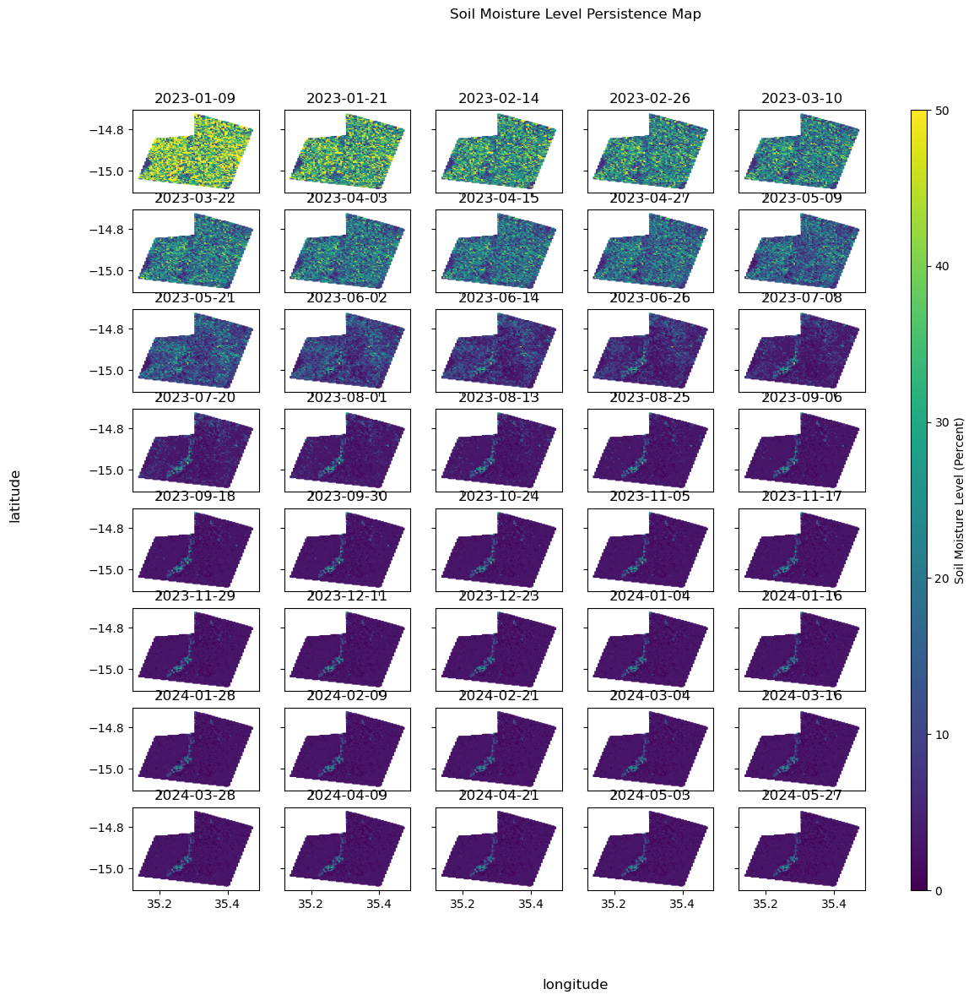

In [51]:
cmap = cm.get_cmap('viridis')
normalizer = Normalize(0, 50)
im = cm.ScalarMappable(norm=normalizer, cmap=cmap)

fig, axs = plt.subplots(8,5, figsize=(14, 12), sharex=True, sharey=True)
for i, ax in enumerate(np.ravel(axs)):
    col = persistence_df.columns[1+i]
    persistence_df.plot(ax=ax, column = col, legend=False, cmap=cmap, norm=normalizer, aspect=None)
    col_date = datetime.strptime(col, "D%Y%m%d")
    ax.set_title(col_date.date())
# plt.tight_layout()

# axs[-1,-1].set_visible(False)

# axs[2,-1].xaxis.set_tick_params(labelbottom=True)
fig.colorbar(im, ax=axs.ravel().tolist(), aspect=50, label="Soil Moisture Level (Percent)")
fig.suptitle("Soil Moisture Level Persistence Map")

fig.supxlabel("longitude")
fig.supylabel("latitude")
# fig.tight_layout()
# plt.savefig(ssm_path/"persistence_max.png")

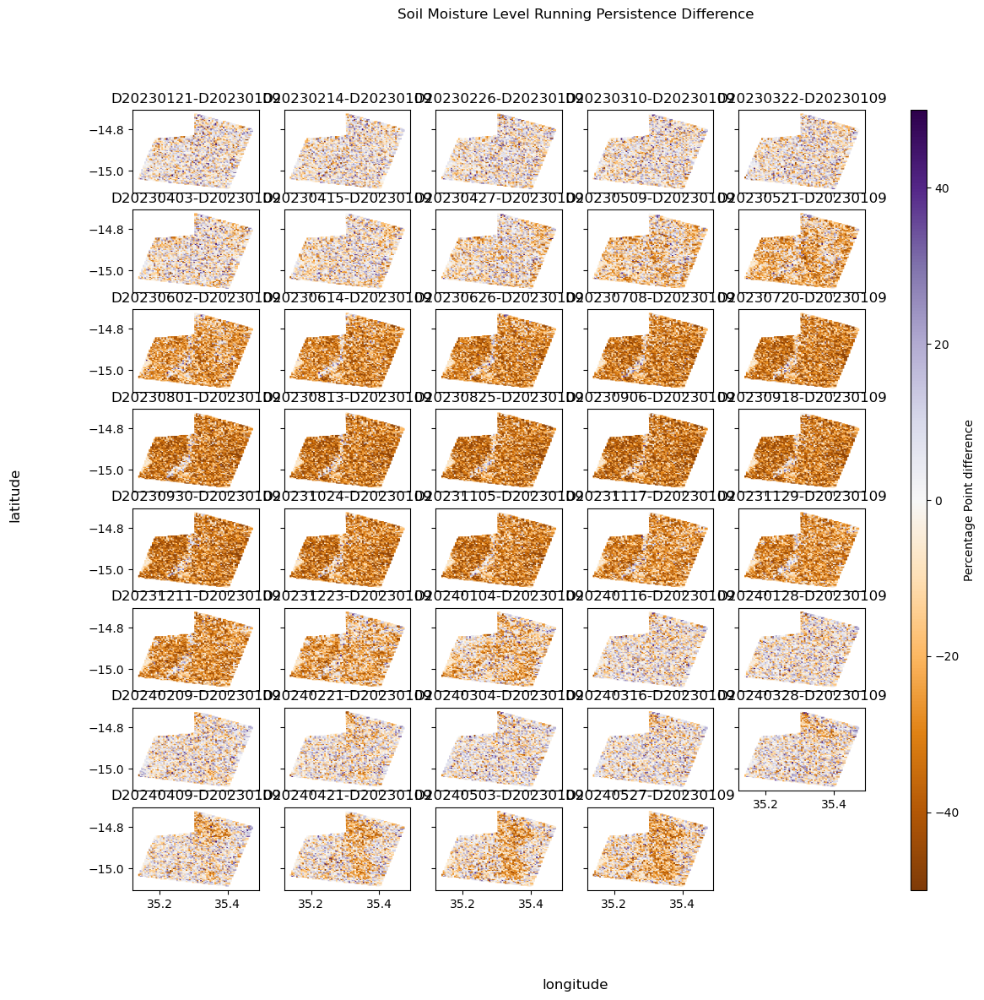

In [97]:
cmap = cm.get_cmap('PuOr')
normalizer = Normalize(-50, 50)
im = cm.ScalarMappable(norm=normalizer, cmap=cmap)

fig, axs = plt.subplots(8,5, figsize=(14, 12), sharex=True, sharey=True)
for i, ax in enumerate(np.ravel(axs)[:-1]):
    col = BD_gdf.columns[1+i]
    BD_gdf.plot(ax=ax, column = col, legend=False, cmap=cmap, norm=normalizer, aspect=None)
    # col_date = datetime.strptime(col, "D%Y%m%d")
    ax.set_title(col)
# plt.tight_layout()

axs[-1,-1].set_visible(False)
axs[-2,-1].xaxis.set_tick_params(labelbottom=True)
fig.colorbar(im, ax=axs.ravel().tolist(), aspect=50, label="Percentage Point difference")
fig.suptitle("Soil Moisture Level Running Persistence Difference")

fig.supxlabel("longitude")
fig.supylabel("latitude")
# fig.tight_layout()
plt.savefig(ssm_path/"base_difference.png")

In [335]:
from geocube.rasterize import rasterize_points_griddata
from functools import partial

In [26]:
cube = make_geocube(gdf, resolution=(-0.001,0.001), rasterize_function=partial(rasterize_points_griddata, method="nearest"), fill=9999)
# for c in cube:
#     cube[c].rio.to_raster(ssm_path/f"ssm_raster/sm_{c}_raster.tif")

In [25]:
cube.D20240104!=cube.D20240104.rio.nodata

<xarray.DataArray 'D20240104' (y: 357, x: 328)>
array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])
Coordinates:
  * y            (y) float64 -14.73 -14.73 -14.73 ... -15.08 -15.08 -15.08
  * x            (x) float64 35.14 35.14 35.14 35.15 ... 35.47 35.47 35.47 35.47
    spatial_ref  int64 0

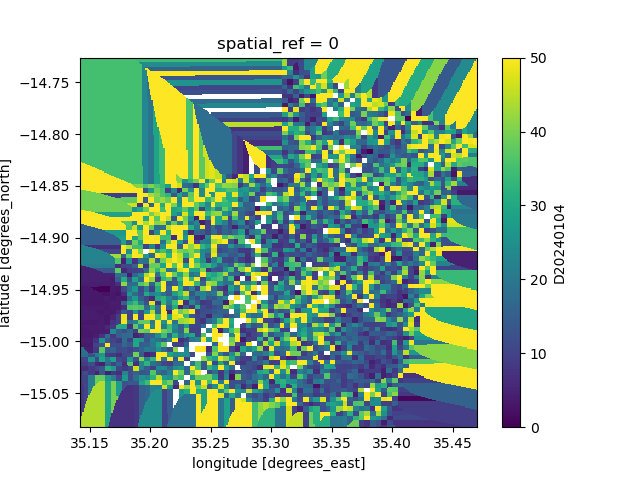

In [27]:
plt.figure()
cube.D20240104.where(cube.D20240104!=cube.D20240104.rio.nodata).plot()
# cube.D20240104.plot()

In [7]:
cube.D20230310.rio.to_raster(ssm_path/"ssm_raster/sm_20230310_poly_raster.tif")

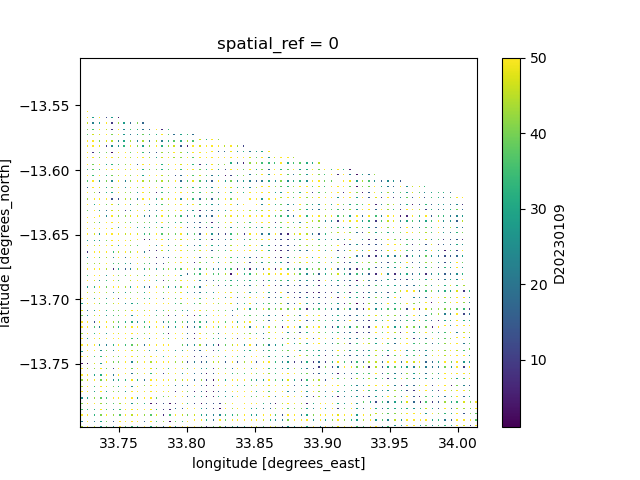

In [308]:
plt.figure()
cube["D20230109"].plot()

In [116]:
from insar4sm.prep_meteo import convert_to_df



In [7]:
aoi = ssm_path.parent.parent/"sentinel1/aoi/dzakela_aoi_bigger.geojson"
meteo_df = convert_to_df(ssm_path/"ERA5/ERA5_20230101T000000_20240531T230000_-13.4_33.6_-13.9_34.2.nc.old", aoi, True)
df_datetimes = pd.to_datetime(gdf.columns[1:], format="D%Y%m%d")


FileNotFoundError: [Errno 2] No such file or directory: b'malawi/SSM/malawi_InSAR_SSM_1km_southern_20230101_20240531/ERA5/ERA5_20230101T000000_20240531T230000_-13.4_33.6_-13.9_34.2.nc.old'

In [21]:
SSM_mean = gdf.mean(numeric_only=True)
plt.plot(meteo_df.index, meteo_df['swvl1__m**3 m**-3']/np.max(meteo_df['swvl1__m**3 m**-3']))
plt.plot(df_datetimes, SSM_mean/SSM_mean.max(), 'o-')

In [4]:
import netCDF4

In [16]:
ERA5_data = netCDF4.Dataset(ssm_path/"ERA5/ERA5_20230101T000000_20240531T230000_-13.4_33.6_-13.9_34.2.nc.old")
mean_swvl1 = np.mean(ERA5_data["swvl1"][:], axis=(1,2))

In [117]:
ERA5_data = netCDF4.Dataset("malawi/ERA5/ERA5_20230101T000000_20240531T230000_malawi_bbox.nc")
meteo_df = convert_to_df("malawi/ERA5/ERA5_20230101T000000_20240531T230000_malawi_bbox.nc", southern_aoi, True)

In [37]:
meteo_df

,Datetimes,tp__m,skt__K,swvl1__m**3 m**-3
Datetimes,,,,
2023-01-01 00:00:00,2023-01-01 00:00:00,0.016567,293.732864,0.439924
2023-01-01 01:00:00,2023-01-01 01:00:00,0.000000,293.779572,0.440994
2023-01-01 02:00:00,2023-01-01 02:00:00,0.000005,294.011792,0.442063
2023-01-01 03:00:00,2023-01-01 03:00:00,0.000007,293.905596,0.443072
2023-01-01 04:00:00,2023-01-01 04:00:00,0.000071,294.382373,0.444653
...,...,...,...,...
2024-05-31 19:00:00,2024-05-31 19:00:00,0.000005,291.093849,0.170898
2024-05-31 20:00:00,2024-05-31 20:00:00,0.000005,289.947734,0.170913
2024-05-31 21:00:00,2024-05-31 21:00:00,0.000005,289.047499,0.170929


In [114]:
ERA5_rxr = rxr.open_rasterio("malawi/ERA5/ERA5_20230101T000000_20240531T230000_malawi_bbox.nc")

In [75]:
ERA5_data['longitude'][0]

masked_array(data=33.2,
             mask=False,
       fill_value=1e+20,
            dtype=float32)

In [12]:
with open("/data/tapas/pearse/malawi/sentinel1/aoi/Liwonde_National_Park.geojson") as gj:
    liwonde_poly = geojson.load(gj)
liwonde_poly = Polygon(liwonde_poly['features'][0]['geometry']['coordinates'][0])

In [4]:
aoi_dir = "/data/tapas/pearse/malawi/sentinel1/aoi"
southern_aoi = aoi_dir + "/southern_malawi_aoi.geojson"

def geojson_to_shapely(gj_file, ind=0):
    with open(gj_file) as gj:
        poly_coords = geojson.load(gj)
    # try account for multipolygon
    # really only works for the specific files here :/
    if poly_coords['features'][ind]['geometry']['type'] == 'MultiPolygon':
        multipoly = []
        for coords in poly_coords['features'][ind]['geometry']['coordinates']:
            poly = Polygon(coords[0])
            multipoly.append(poly)
        multipoly = MultiPolygon(multipoly)
        return multipoly
    else:
        poly = Polygon(
            poly_coords['features'][ind]['geometry']['coordinates'][0])
        return poly
roi_poly = geojson_to_shapely(southern_aoi)

In [5]:
national_parks = aoi_dir + "/protected_areas.json"
malawi = \
    aoi_dir + "/geoBoundaries-MWI-ADM0.geojson"
with open(national_parks) as gj:
    nparks = geojson.load(gj)
with open(malawi) as gj:
    malawi_json = geojson.load(gj) 

In [11]:
malawi_poly = geojson_to_shapely(malawi)

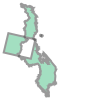

In [73]:
path152fp = geojson_to_shapely(aoi_dir+"/path_152_footprint.geojson")
path152fp ^ malawi_poly

In [39]:
malawi_json['features'][0]['geometry']['type']


'MultiPolygon'

In [17]:
kasungu = geojson_to_shapely(national_parks, 25)
liwonde = geojson_to_shapely(national_parks, 6)

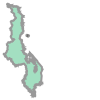

In [18]:
liwonde ^ malawi_poly

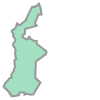

In [19]:
liwonde

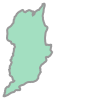

In [109]:
kasungu

In [111]:
features = []
features.append(Feature(geometry=kasungu))
feature_collection = FeatureCollection(features)
with open("/data/tapas/pearse/malawi/sentinel1/aoi/kasungu_np.geojson", "w") as gj:
    dump(feature_collection, gj)

In [24]:
ssm_multi = MultiPolygon(gdf['geometry'].values)

In [26]:
ssm_multi.is_valid

False

In [45]:
intersects = []
not_intersects = []
for i in range(len(gdf)):
    intersects.append(gdf['geometry'][i].intersects(liwonde))
    not_intersects.append(not gdf['geometry'][i].intersects(liwonde))
np.sum(intersects), np.sum(not_intersects)

(1929, 1577)

In [46]:
len(gdf), 1929+1577

(3506, 3506)

In [39]:
gdf['intersects_park'] = gdf['geometry'].map(lambda x: x.intersects(liwonde))

In [108]:
gdf_inside_park = gdf.where(gdf['intersects_park']).dropna()
gdf_outside_park = gdf.where(gdf['intersects_park'] == False).dropna()

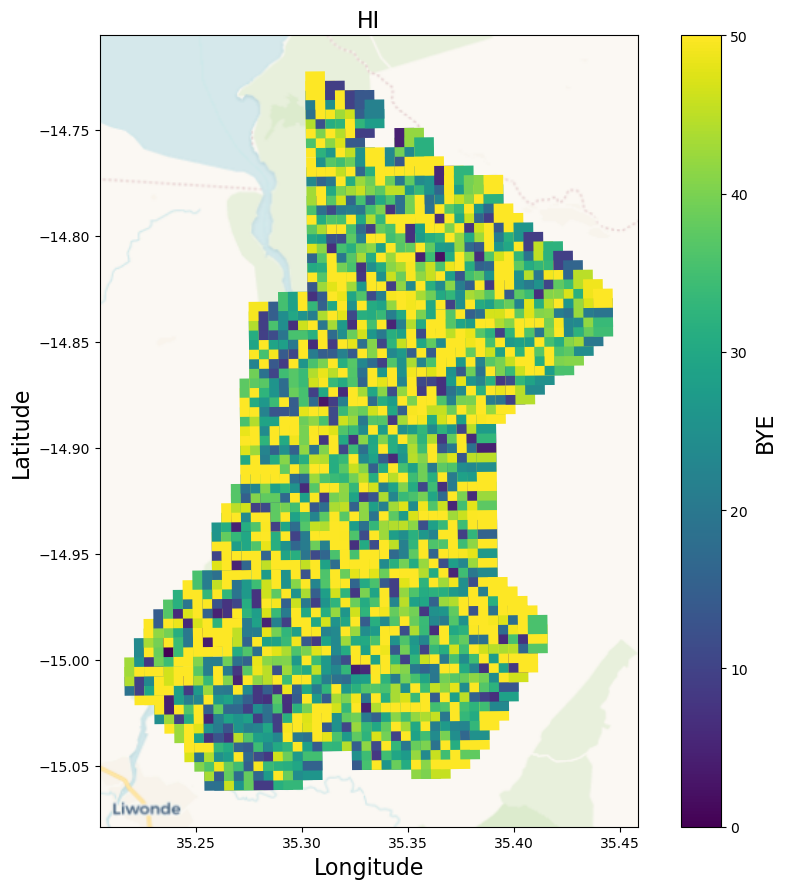

In [56]:
fig,ax = plt.subplots(1,1,figsize=(9,9))
cmap="viridis"
normalizer = Normalize(0, 50)
im = cm.ScalarMappable(norm=normalizer, cmap=cmap)
gax = gdf.where(gdf['intersects_park']).plot(column=gdf_inside_park.columns[1], ax=ax, legend=False, cmap=cmap, norm=normalizer)
cb = fig.colorbar(im, ax=ax)
cb.set_label(label="BYE",size=16)
ax.set_title("HI", fontdict={"size":16})
ax.set_ylabel("Latitude", fontdict={"size":16})
ax.set_xlabel("Longitude", fontdict={"size":16})
cx.add_basemap(gax, crs=gdf_inside_park.crs.to_string(), source=cx.providers.CartoDB.Voyager(attribution=""))

plt.tight_layout()

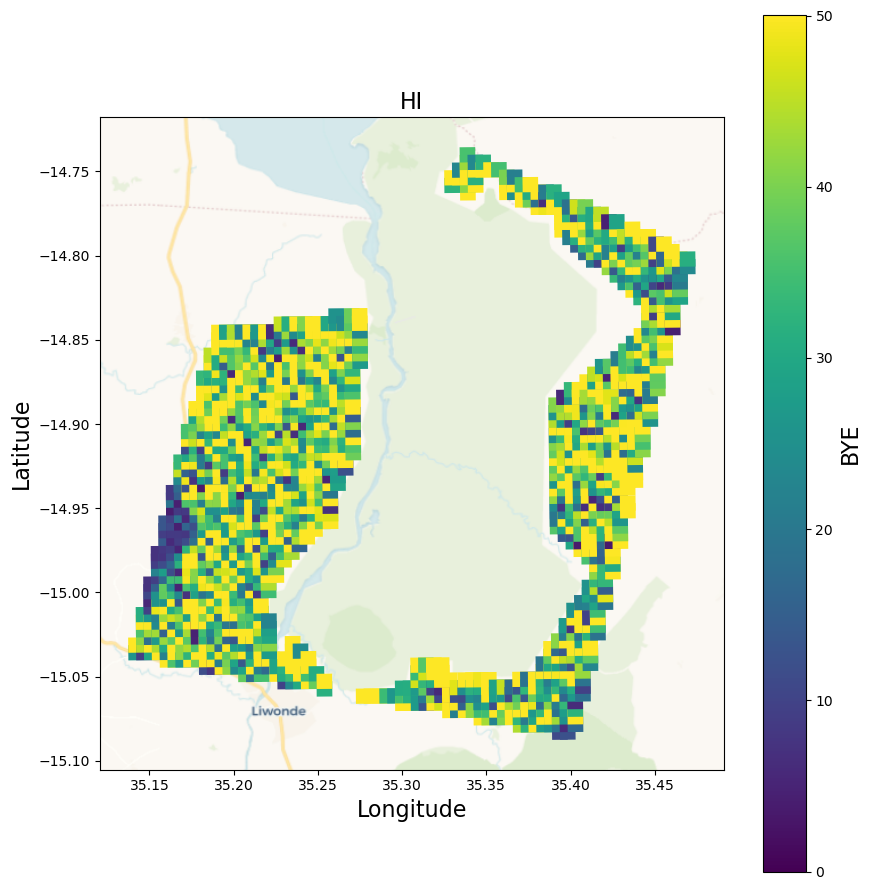

In [55]:
fig,ax = plt.subplots(1,1,figsize=(9,9))
cmap="viridis"
normalizer = Normalize(0, 50)
im = cm.ScalarMappable(norm=normalizer, cmap=cmap)
gax = gdf_outside_park.plot(column=gdf_outside_park.columns[1], ax=ax, legend=False, cmap=cmap, norm=normalizer)
cb = fig.colorbar(im, ax=ax)
cb.set_label(label="BYE",size=16)
ax.set_title("HI", fontdict={"size":16})
ax.set_ylabel("Latitude", fontdict={"size":16})
ax.set_xlabel("Longitude", fontdict={"size":16})
cx.add_basemap(gax, crs=gdf_outside_park.crs.to_string(), source=cx.providers.CartoDB.Voyager(attribution=""))

plt.tight_layout()

In [57]:
gdf_outside_park.columns

Index(['geometry', 'D20230109', 'D20230121', 'D20230214', 'D20230226',
       'D20230310', 'D20230322', 'D20230403', 'D20230415', 'D20230427',
       'D20230509', 'D20230521', 'D20230602', 'D20230614', 'D20230626',
       'D20230708', 'D20230720', 'D20230801', 'D20230813', 'D20230825',
       'D20230906', 'D20230918', 'D20230930', 'D20231024', 'D20231105',
       'D20231117', 'D20231129', 'D20231211', 'D20231223', 'D20240104',
       'D20240116', 'D20240128', 'D20240209', 'D20240221', 'D20240304',
       'D20240316', 'D20240328', 'D20240409', 'D20240421', 'D20240503',
       'D20240527', 'intersects_park'],
      dtype='object')

In [92]:
gdf_outside_park['geometry'].reset_index(drop=True)

0       POLYGON ((35.14672 -15.03119, 35.14681 -15.040...
1       POLYGON ((35.14667 -15.02667, 35.14676 -15.035...
2       POLYGON ((35.15136 -15.03114, 35.15145 -15.040...
3       POLYGON ((35.15132 -15.02663, 35.15141 -15.035...
4       POLYGON ((35.15127 -15.02211, 35.15136 -15.031...
                              ...                        
1511    POLYGON ((35.46952 -14.80658, 35.46963 -14.815...
1512    POLYGON ((35.46947 -14.80206, 35.46958 -14.811...
1513    POLYGON ((35.46942 -14.79754, 35.46952 -14.806...
1514    POLYGON ((35.47412 -14.80201, 35.47422 -14.811...
1515    POLYGON ((35.47406 -14.79749, 35.47417 -14.806...
Name: geometry, Length: 1516, dtype: geometry

In [102]:
running_difference = gdf_outside_park[gdf_outside_park.columns[2:-1]].values - \
    gdf_outside_park[gdf_outside_park.columns[1:-2]].values

running_difference_col_names = [d1[3:] + '-' + d0[3:] for d1, d0 in zip(
    gdf_outside_park.columns[2:-1], gdf_outside_park.columns[1:-2])]
running_difference_dict = {col_name: value for col_name, value in zip(
    running_difference_col_names, running_difference.T)}
running_difference_df = pd.DataFrame(running_difference_dict)
running_difference_gdf_outside_park = gpd.GeoDataFrame(pd.concat([gdf_outside_park['geometry'].reset_index(drop=True), running_difference_df], axis=1))

In [103]:
type(running_difference_gdf_outside_park)

geopandas.geodataframe.GeoDataFrame

<AxesSubplot:>

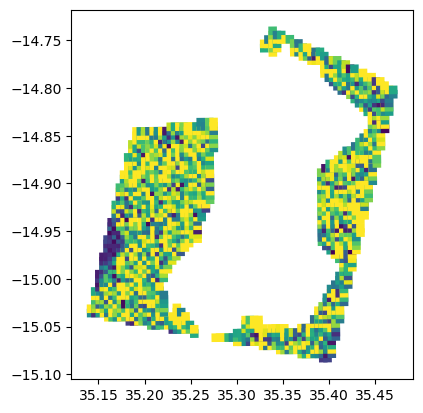

In [81]:
gdf_outside_park.plot("D20230109")

<AxesSubplot:>

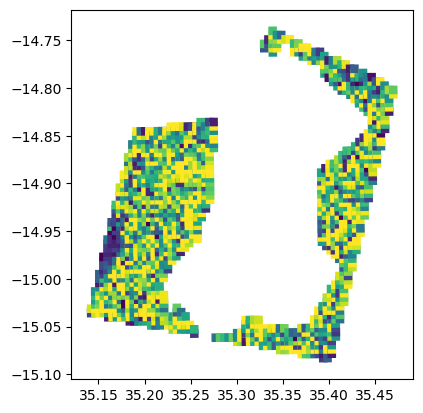

In [82]:
gdf_outside_park.plot("D20230121")

<AxesSubplot:>

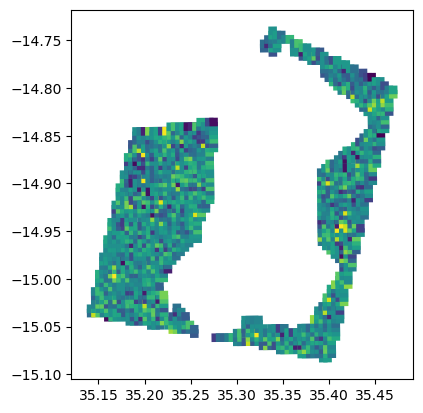

In [104]:
running_difference_gdf_outside_park.plot("230121-230109")

In [33]:
{i:nparks['features'][i]["properties"]["TYPE"] for i in range(len(nparks['features']))}.keys()

dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86])

In [12]:
for feature in nparks["features"]:
    if feature["properties"]["TYPE"] != 100:
        print(feature["properties"]["NAME"], feature["properties"]["TYPE"], feature["properties"]["TYPE_TXT"])
        

NYIKA 300 National Park
LIWONDE 300 National Park
VWAZA MARSH 200 Game Reserve
UZUMARA 0 Forest Reserve
KASUNGU 300 National Park
NKHOTAKOTA 200 Game Reserve
LAKE MALAWI 300 National Park
LAKE MALAWI 300 National Park
LAKE MALAWI 300 National Park
LAKE MALAWI 300 National Park
LAKE MALAWI 300 National Park
LAKE MALAWI 300 National Park
LAKE MALAWI 300 National Park
LAKE MALAWI 300 National Park
MAJETE 200 Game Reserve
LENGWE 300 National Park
MWABVI 200 Game Reserve


In [67]:
# only_parks_dict = {
#     'type': nparks['type'],
#     'crs': nparks['crs'],
#     'bbox': nparks['bbox'],
#     'features': []
    # }
def find_ind_for_park(park_name, nparks):
    for i, feature in enumerate(nparks['features']):
        # TYPE seems to be 300 for national parks
        if feature["properties"]["TYPE"] == 300:
            if feature["properties"]["NAME"] == park_name:
                return i

find_ind_for_park("KASUNGU", nparks)

25

In [64]:
nparks['features'][1]["properties"]

{'AREA': 7709413,
 'PERIMETER': 11407.3131,
 'HECTARES': 770.9413,
 'KM_SQ': 7.70941,
 'NAME': 'MUGESSE',
 'TYPE': 100,
 'TYPE_TXT': 'Forest Reserve',
 'NAME_LOW': 'Mughesse',
 'PROT_DATE': 1948,
 'GAZ_DATE': 1948,
 'GAZ_DECADE': 40,
 'GAZ_1964': 1,
 'ADD_DATE': 0,
 'RATIONALE1': 'catchment protection',
 'R1_CODE': 1,
 'RATIONALE2': 'conservation of biodiversity',
 'R2_CODE': 3,
 'RATIONALE3': '',
 'R3_CODE': 0,
 'RATIONALE4': '',
 'R4_CODE': 0,
 'MA_PROT_': 3,
 'MA_PROT_ID': 2,
 'BUFFER_POP': 6487,
 'NEWFIELD': 0,
 'bbox': [33.53344646171383,
  -9.667216238273324,
  33.570121463747576,
  -9.636711442732546]}

In [15]:
for i in range(nparks['totalFeatures']):
    print(i,nparks['features'][i]['id'])

0 protected_areas_geo.1
1 protected_areas_geo.2
2 protected_areas_geo.3
3 protected_areas_geo.4
4 protected_areas_geo.5
5 protected_areas_geo.6
6 protected_areas_geo.57
7 protected_areas_geo.7
8 protected_areas_geo.8
9 protected_areas_geo.9
10 protected_areas_geo.10
11 protected_areas_geo.11
12 protected_areas_geo.12
13 protected_areas_geo.13
14 protected_areas_geo.14
15 protected_areas_geo.15
16 protected_areas_geo.16
17 protected_areas_geo.17
18 protected_areas_geo.18
19 protected_areas_geo.24
20 protected_areas_geo.77
21 protected_areas_geo.25
22 protected_areas_geo.19
23 protected_areas_geo.20
24 protected_areas_geo.21
25 protected_areas_geo.22
26 protected_areas_geo.23
27 protected_areas_geo.26
28 protected_areas_geo.27
29 protected_areas_geo.28
30 protected_areas_geo.32
31 protected_areas_geo.29
32 protected_areas_geo.30
33 protected_areas_geo.31
34 protected_areas_geo.33
35 protected_areas_geo.67
36 protected_areas_geo.34
37 protected_areas_geo.35
38 protected_areas_geo.36
39 pr

In [16]:
nparks['features'][6]['properties']

{'AREA': 546327379.95313,
 'PERIMETER': 158462.21956,
 'HECTARES': 54632.738,
 'KM_SQ': 546.32738,
 'NAME': 'LIWONDE',
 'TYPE': 300,
 'TYPE_TXT': 'National Park',
 'NAME_LOW': 'Liwonde',
 'PROT_DATE': 1969,
 'GAZ_DATE': 1972,
 'GAZ_DECADE': 70,
 'GAZ_1964': 2,
 'ADD_DATE': 1977,
 'RATIONALE1': 'conservation of biodiversity',
 'R1_CODE': 1,
 'RATIONALE2': '',
 'R2_CODE': 0,
 'RATIONALE3': '',
 'R3_CODE': 0,
 'RATIONALE4': '',
 'R4_CODE': 0,
 'MA_PROT_': 58,
 'MA_PROT_ID': 82,
 'BUFFER_POP': 78231,
 'NEWFIELD': 1,
 'bbox': [35.224962709145494,
  -15.055728291878745,
  35.43825236457232,
  -14.592351372905961]}

In [14]:
def plot_total_precipitation(t1):
   t0 = datetime(2023,1,1,0,0,0)
   two_weeks_in_hours = 2*7*24
   dt = t1-t0
   total_hours = int(dt.total_seconds()/(60*60))
   fig, ax = plt.subplots(1,1, figsize=(9,9))
   im = ax.imshow(np.sum(ERA5_data['tp'][total_hours-two_weeks_in_hours:total_hours], axis=0), extent=[
      ERA5_data['longitude'][0],
      ERA5_data['longitude'][-1],
      ERA5_data['latitude'][-1],
      ERA5_data['latitude'][0]
   ], vmin=0, vmax=0.25)
   ax.plot(*liwonde_poly.exterior.xy, color='r')
   ax.plot(*roi_poly.exterior.xy, color='orange')
   cb = fig.colorbar(im, ax=ax)
   cb.set_label(label="Total precipitation (m)")
   plt.xlabel("Longitude")
   plt.ylabel("Latitude")
   plt.title(f"Preciptiation {ERA5_rxr['time'].data[total_hours-two_weeks_in_hours].isoformat()} - {ERA5_rxr['time'].data[total_hours].isoformat()}")
   plt.savefig(f"Liwonde_total_preciptiation_{ERA5_rxr['time'].data[total_hours].isoformat()}.png")

Text(0.5, 1.0, 'Preciptiation 2024-04-19T02:00:00 - 2024-05-03T02:00:00')

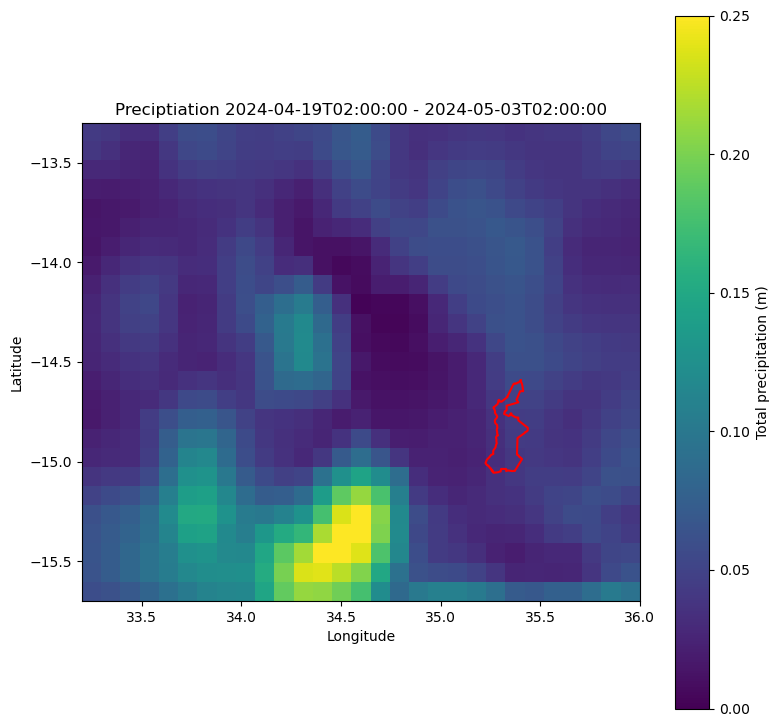

In [121]:
fig, ax = plt.subplots(1,1, figsize=(9,9))
two_weeks_in_hours = 2*7*24
im = ax.imshow(np.sum(ERA5_data['tp'][11714-two_weeks_in_hours:11714], axis=0), extent=[
   ERA5_data['longitude'][0],
   ERA5_data['longitude'][-1],
   ERA5_data['latitude'][-1],
   ERA5_data['latitude'][0]
], vmin=0, vmax=0.25)
cont = ax.plot(*liwonde.geoms[0].exterior.xy, color='r')
cb = fig.colorbar(im, ax=ax)
cb.set_label(label="Total precipitation (m)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title(f"Preciptiation {ERA5_rxr['time'].data[11714-two_weeks_in_hours].isoformat()} - {ERA5_rxr['time'].data[11714].isoformat()}")
# plt.savefig("Liwonde_total_preciptiation_20240503.png")

In [146]:
import skimage as ski


In [188]:
r,c = liwonde[0].exterior.xy

/tmp/ipykernel_2381653/3452336530.py:1: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  r,c = liwonde[0].exterior.xy


In [183]:
r = r - ERA5_data['longitude'][0].data
c = r - ERA5_data['latitude'][0].data

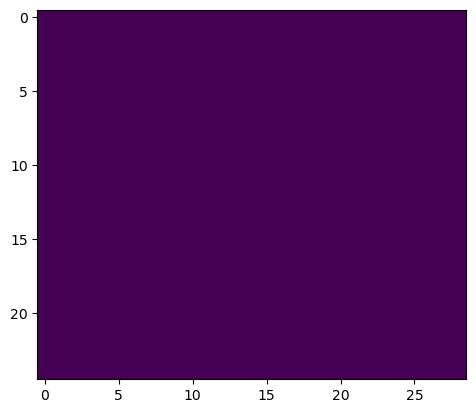

In [169]:
liwonde_fill = np.zeros(ERA5_data['tp'][0].shape)
rr, cc = ski.draw.polygon(r,c)
liwonde_fill[rr,cc] = 1
plt.imshow(liwonde_fill, )

In [196]:
len(r)

3558

In [219]:
ERA5_data['tp'][0]

(25, 29)

In [222]:
liwonde[0].centroid.xy

/tmp/ipykernel_2381653/361555841.py:1: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  liwonde[0].centroid.xy


(array('d', [35.3337875141221]), array('d', [-14.865367199206915]))

In [ ]:
ERA5_rxr.where(ERA5_rxr.y)

In [214]:
ERA5_rxr.sel(y=c, x=r, method="nearest")['tp'][0].data

array([[-22071, -22071, -22071, ..., -22071, -22071, -22071],
       [-22071, -22071, -22071, ..., -22071, -22071, -22071],
       [-22071, -22071, -22071, ..., -22071, -22071, -22071],
       ...,
       [-22071, -22071, -22071, ..., -22071, -22071, -22071],
       [-22071, -22071, -22071, ..., -22071, -22071, -22071],
       [-22071, -22071, -22071, ..., -22071, -22071, -22071]], dtype=int16)

In [194]:
ERA5_rxr.y

<xarray.DataArray 'y' (y: 25)>
array([-13.3, -13.4, -13.5, -13.6, -13.7, -13.8, -13.9, -14. , -14.1, -14.2,
       -14.3, -14.4, -14.5, -14.6, -14.7, -14.8, -14.9, -15. , -15.1, -15.2,
       -15.3, -15.4, -15.5, -15.6, -15.7])
Coordinates:
  * y            (y) float64 -13.3 -13.4 -13.5 -13.6 ... -15.4 -15.5 -15.6 -15.7
    spatial_ref  int64 0

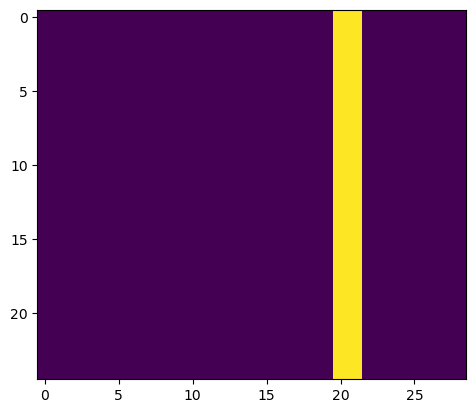

In [247]:
w,s,e,n = liwonde.bounds
bottom_ind = np.argmin(np.abs(ERA5_data['latitude'][:] - s))
top_ind = np.argmin(np.abs(ERA5_data['latitude'][:] - n))
left_ind = np.argmin(np.abs(ERA5_data['longitude'][:] - w))
right_ind = np.argmin(np.abs(ERA5_data['longitude'][:] - e))

# lat_range = np.logical_and()

liwonde_fill = np.zeros(ERA5_data['tp'][0].shape)

liwonde_fill[:,left_ind:right_ind] = 1
plt.imshow(liwonde_fill, )

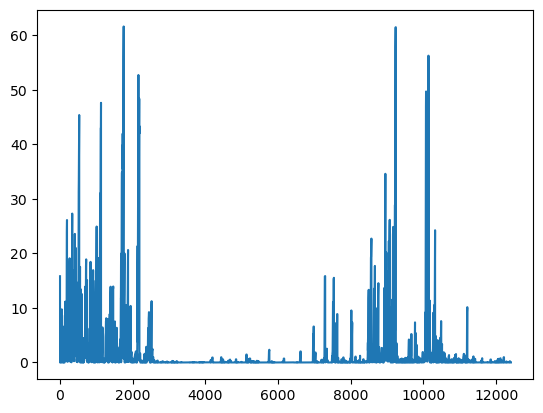

In [269]:
plt.plot(1e3*np.mean(ERA5_data['tp'][:,top_ind:bottom_ind, left_ind:right_ind], axis=(1,2)))

In [258]:
ERA5_data['longitude'][left_ind:right_ind+1].data, w,e

(array([35.2, 35.3, 35.4], dtype=float32), 35.224963, 35.438252)

In [259]:
ERA5_data['latitude'][top_ind:bottom_ind+1].data, n,s

(array([-14.6, -14.7, -14.8, -14.9, -15. , -15.1], dtype=float32),
 -14.592351,
 -15.055728)

In [234]:
ERA5_data['tp'], ERA5_data['longitude']

(<class 'netCDF4._netCDF4.Variable'>
 int16 tp(time, latitude, longitude)
     _FillValue: -32767
     units: m
     long_name: Total precipitation
     add_offset: 0.03940603354213574
     scale_factor: 1.2026501111559463e-06
     missing_value: -32767
 unlimited dimensions: 
 current shape = (12408, 25, 29)
 filling on,
 <class 'netCDF4._netCDF4.Variable'>
 float32 longitude(longitude)
     _FillValue: nan
     units: degrees_east
     long_name: longitude
 unlimited dimensions: 
 current shape = (29,)
 filling on)

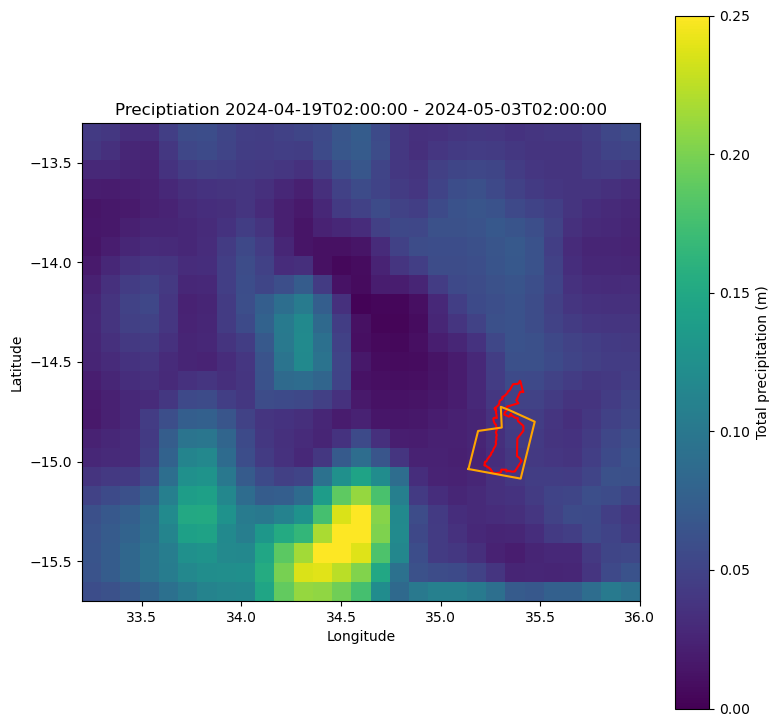

In [17]:
plot_total_precipitation(datetime(2024,5,3,2,0,0))

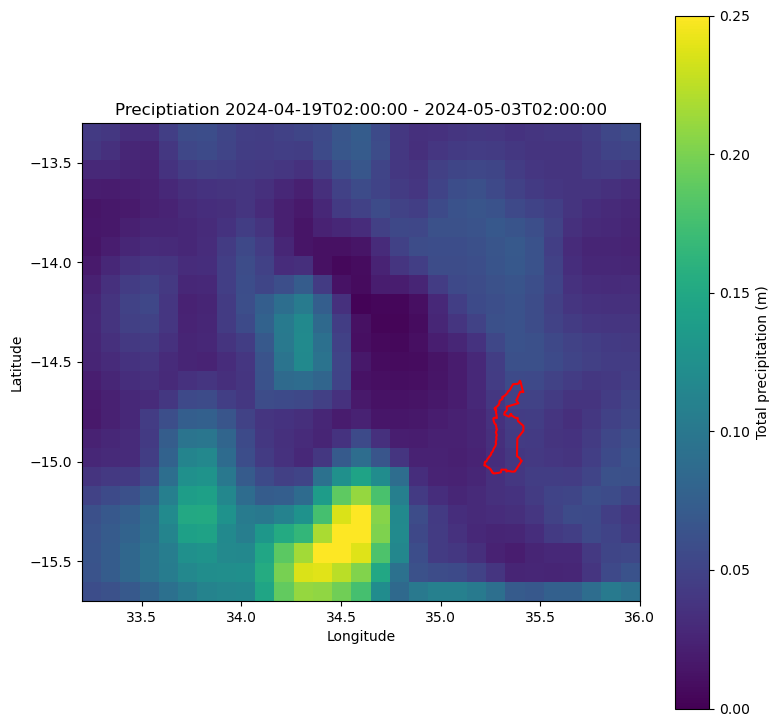

In [29]:
fig, ax = plt.subplots(1,1, figsize=(9,9))
im = ax.imshow(np.sum(ERA5_data['tp'][11714-two_weeks_in_hours:11714], axis=0), extent=[
   ERA5_data['longitude'][0],
   ERA5_data['longitude'][-1],
   ERA5_data['latitude'][-1],
   ERA5_data['latitude'][0]
], vmin=0, vmax=0.25)
ax.plot(*liwonde_poly.exterior.xy, color='r')
cb = fig.colorbar(im, ax=ax)
cb.set_label(label="Total precipitation (m)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title(f"Preciptiation {ERA5_rxr['time'].data[11714-two_weeks_in_hours].isoformat()} - {ERA5_rxr['time'].data[11714].isoformat()}")
plt.savefig("Liwonde_total_preciptiation_20240503.png")

In [144]:
cft = ERA5_rxr['time'].data[11714]

In [148]:
cft.isoformat()

'2024-05-03T02:00:00'

In [108]:
np.sum(ERA5_data['tp'][-two_weeks_in_hours:], axis=0)

masked_array(
  data=[[0.02229954, 0.02329533, 0.02558638, 0.02933023, 0.03541805,
         0.04077705, 0.04314748, 0.05389556, 0.06520528, 0.05635739,
         0.03915708, 0.02613479, 0.02651603, 0.03817933, 0.04716673,
         0.03513182, 0.02584255, 0.02483232, 0.02435246, 0.02387742,
         0.02500911, 0.02826468, 0.0286375 , 0.02988345, 0.03091893,
         0.03061466, 0.0338979 , 0.0386207 , 0.03977044],
        [0.02165853, 0.02162726, 0.02381728, 0.02741321, 0.03361167,
         0.04099954, 0.04679993, 0.05596773, 0.06531593, 0.05842955,
         0.04054494, 0.02548055, 0.04321483, 0.05512347, 0.06152157,
         0.05211203, 0.0380278 , 0.02206743, 0.02415402, 0.02376797,
         0.0250488 , 0.02818411, 0.02996162, 0.02797003, 0.02643906,
         0.02566095, 0.02934587, 0.03403019, 0.0375323 ],
        [0.0229634 , 0.02257495, 0.02356833, 0.02720395, 0.03477583,
         0.04593642, 0.05102363, 0.05248365, 0.05902486, 0.05065442,
         0.03627072, 0.02842824, 0.0491667

In [119]:
t0 = datetime(2023,1,1,0,0,0)
t1 = datetime(2024,5,3,2,0,0)
dt = t1-t0
dt.total_seconds()/(60*60)
# two_weeks_in_hours = 2*7*24


11714.0

In [101]:
ERA5_rxr['time'][12290]

<xarray.DataArray 'time' ()>
array(cftime.DatetimeProlepticGregorian(2024, 5, 27, 2, 0, 0, 0, has_year_zero=True),
      dtype=object)
Coordinates:
    time         object 2024-05-27 02:00:00
    spatial_ref  int64 0
Attributes:
    long_name:  time

In [55]:
np.max(ERA5_data['tp'][-1])

9.621200889251003e-06

In [35]:
plot_ERA5 = ERA5_rxr['tp'][-1].data
plot_ERA5[plot_ERA5 == ]

array([[-32766, -32766, -32766, -32766, -32766, -32766, -32766, -32766,
        -32766, -32766, -32766, -32766, -32766, -32766, -32766, -32766,
        -32766, -32766, -32766, -32766, -32766, -32766, -32766, -32766,
        -32766, -32766, -32766, -32766, -32766],
       [-32766, -32766, -32766, -32766, -32766, -32766, -32766, -32766,
        -32766, -32766, -32766, -32766, -32766, -32766, -32766, -32766,
        -32766, -32766, -32766, -32766, -32766, -32766, -32766, -32766,
        -32766, -32766, -32766, -32766, -32766],
       [-32766, -32766, -32766, -32766, -32766, -32766, -32766, -32766,
        -32766, -32766, -32766, -32766, -32766, -32766, -32766, -32766,
        -32766, -32766, -32766, -32766, -32766, -32766, -32766, -32766,
        -32766, -32766, -32766, -32766, -32766],
       [-32766, -32766, -32766, -32766, -32766, -32766, -32766, -32766,
        -32766, -32766, -32766, -32766, -32766, -32766, -32766, -32766,
        -32766, -32766, -32766, -32766, -32766, -32766, -3276

In [33]:
ERA5_rxr['tp'][-1].data.min()


-32766

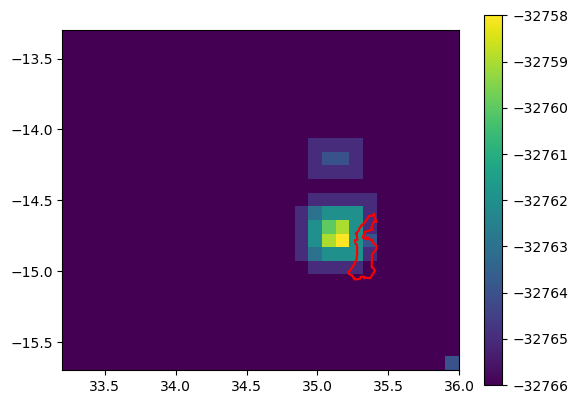

In [70]:
# plt.figure(figsize=(12,12))
plt.imshow(ERA5_rxr['tp'][-1].data, extent=[ERA5_rxr['x'][0], ERA5_rxr['x'][-1],ERA5_rxr['y'][-1],ERA5_rxr['y'][0]])
plt.plot(*liwonde_poly.exterior.xy, color='r')
plt.colorbar()

In [11]:
import json
with open(aoi) as aoi_json:
    AOI = json.load(aoi_json)

In [61]:
AOI

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'properties': {},
   'geometry': {'coordinates': [[[33.821131044120136, -13.607697540837208],
      [33.821131044120136, -13.704520394637441],
      [33.91537504848188, -13.704520394637441],
      [33.91537504848188, -13.607697540837208],
      [33.821131044120136, -13.607697540837208]]],
    'type': 'Polygon'}}]}

In [12]:
'T'.join(ERA5_data["time"].units.split(' ')[-2:])

'2023-03-01T00:00:00'

In [7]:
from datetime import datetime, timedelta

In [19]:
d0 = datetime.strptime('T'.join(ERA5_data["time"].units.split(' ')[-2:]), "%Y-%m-%dT%H:%M:%S")
days = d0 + ERA5_data["time"][:].data[::24]*timedelta(hours=1)

In [40]:
ERA5_data

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    Conventions: CF-1.6
    history: 2024-06-20 14:40:57 GMT by grib_to_netcdf-2.28.1: /opt/ecmwf/mars-client/bin/grib_to_netcdf -S param -o /cache/data0/adaptor.mars.internal-1718894453.2242477-22728-1-36e04c69-84a5-4f91-a075-2b865ed698e6.nc /cache/tmp/36e04c69-84a5-4f91-a075-2b865ed698e6-adaptor.mars.internal-1718894211.3349624-22728-1-tmp.grib
    dimensions(sizes): longitude(29), latitude(25), time(12408)
    variables(dimensions): float32 longitude(longitude), float32 latitude(latitude), int64 time(time), int16 tp(time, latitude, longitude), int16 skt(time, latitude, longitude), int16 swvl1(time, latitude, longitude)
    groups: 

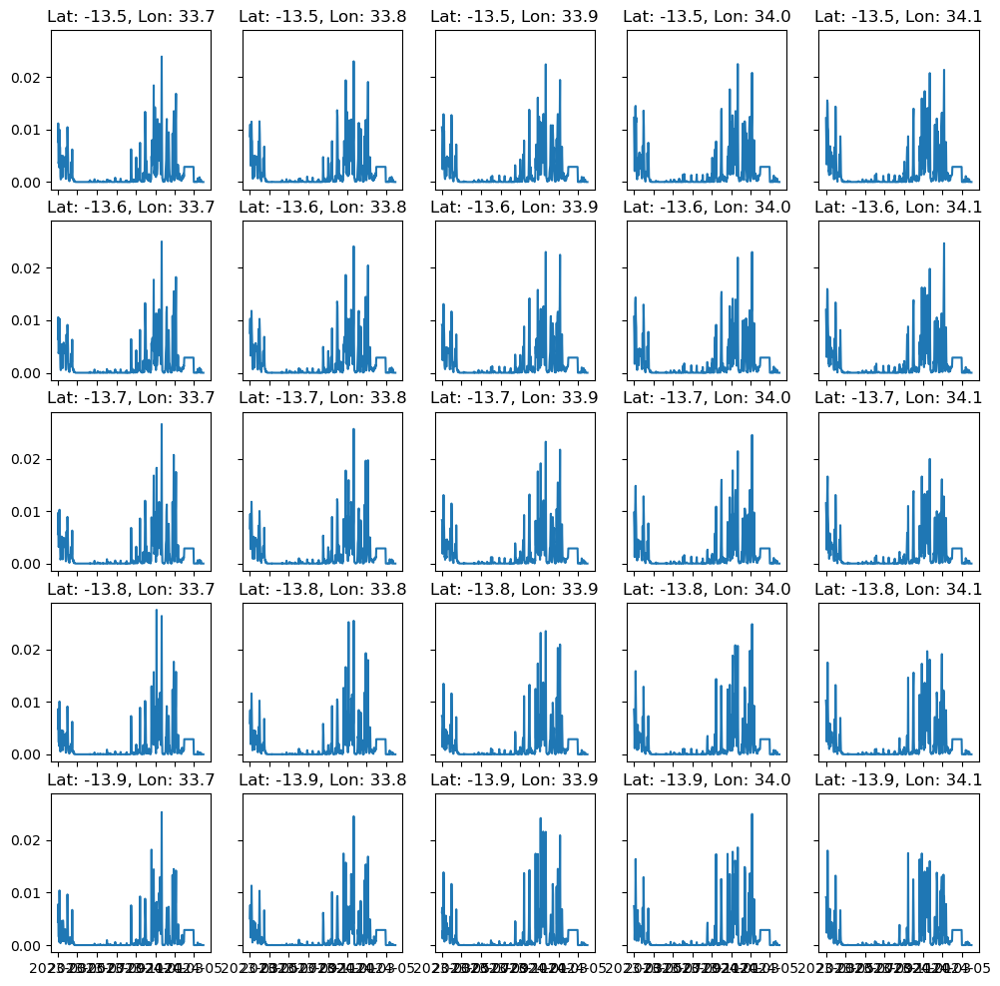

In [16]:
fig, ax = plt.subplots(5,5, figsize=(12,12),sharex=True, sharey=True)
for i in range(5):
    for j in range(5):
        daily_mean = np.mean(ERA5_data["tp"][:,i,j].reshape(-1, 24), axis=1)
        ax[i,j].plot(days, daily_mean)
        lat = str(ERA5_data["latitude"][:][i])
        lon = str( ERA5_data["longitude"][:][j])
        ax[i,j].set_title(f"Lat: {lat}, Lon: {lon}")

# plt.plot(ERA5_data["swvl1"][:,0,0])
# plt.plot(meteo_df['swvl1__m**3 m**-3'].values)

In [11]:
daily_mean_swvl1 = np.mean(mean_swvl1.reshape(-1, 24), axis=1)
plt.plot(days[::12],daily_mean_swvl1[::12])

In [225]:
days.shape

(517,)

NameError: name 'df_datetimes' is not defined

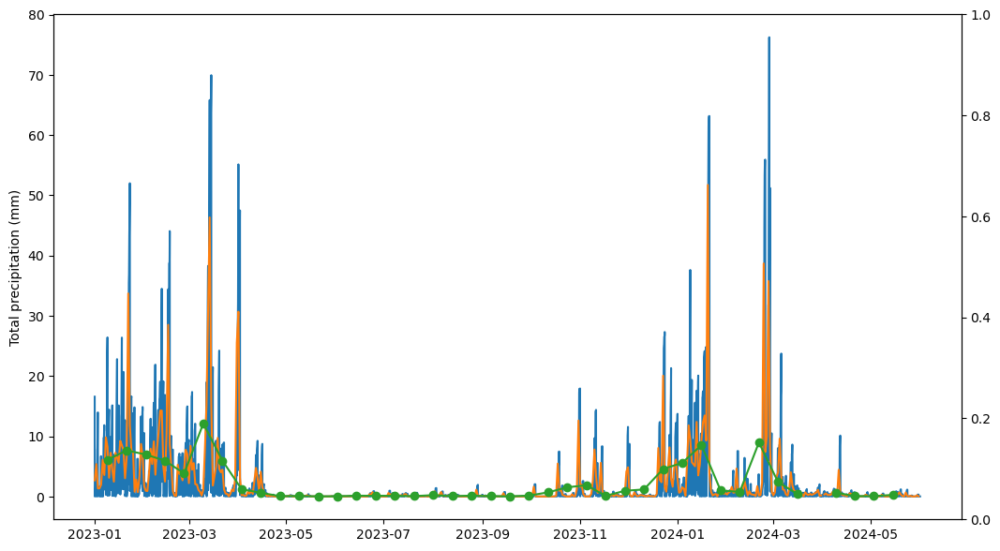

In [20]:
SSM_mean = gdf.mean(numeric_only=True)
# SSM_median = gdf.median(numeric_only=True)
fig, ax1 = plt.subplots(figsize=(12.5,7))
# mean_tp = np.mean(ERA5_data["tp"][:], axis=(1,2))
mean_tp = meteo_df['tp__m'].values*1e3
daily_cumulative_tp = np.sum(mean_tp.reshape(-1, 24), axis=1)
days_start, days_end = 8, -5
revisit_cumulitave_tp = np.sum(daily_cumulative_tp[days_start:days_end].reshape(-1, 12), axis=1)
# revisit_cumulitave_tp1 = np.sum(mean_tp[days_start*24:days_end*24].reshape(-1, 12*24), axis=1)

tp_hour = ax1.plot(meteo_df.index, mean_tp, label="hourly cumulative precipitation")
tp_day = ax1.plot(days, daily_cumulative_tp/24, label="daily cumulative preciptiation (average per hour)")
tp = ax1.plot(days[days_start:days_end][::12], revisit_cumulitave_tp/(12*24), 'o-', label="12 day cumulative precipitation (average per hour)")

ax1.set_ylabel("Total precipitation (mm)")
ax2 = ax1.twinx()
smi = ax2.plot(df_datetimes, SSM_mean, 'o-', color="grey",label="Soil moisture inversion")
# smi_med = ax2.plot(df_datetimes, SSM_median, 'o-', color="black",label="Soil moisture inversion median")
ax1.set_xlabel("Date")
ax2.set_ylabel("Soil moisture level (percentage)")



handles = tp_hour +tp_day+tp+smi
labels = [l.get_label() for l in handles]
ax1.legend(handles, labels, loc=(0.25,0.8))
plt.savefig("soil_moisture_inversion_vs_hourly_cumulative_precipitation.png")

In [21]:
import netCDF4
ERA5_data = netCDF4.Dataset("/data/tapas/pearse/malawi/ERA5/ERA5_20230101T000000_20240531T230000_malawi_bbox.nc")
d0 = datetime.strptime('T'.join(ERA5_data["time"].units.split(' ')[-2:]), "%Y-%m-%dT%H:%M:%S")
days = d0 + ERA5_data["time"][:].data[::24]*timedelta(hours=1)



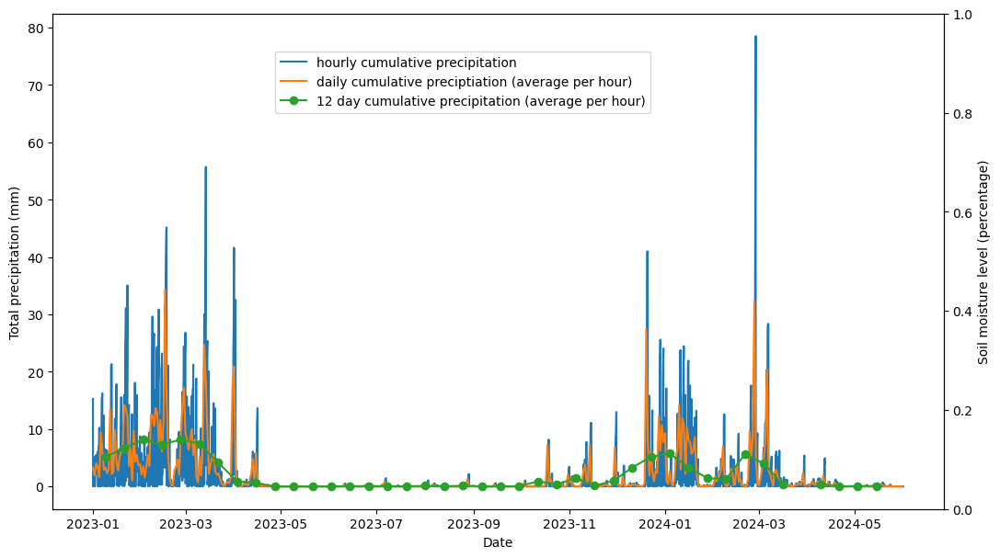

In [22]:
# SSM_mean = gdf.mean(numeric_only=True)
# SSM_median = gdf.median(numeric_only=True)

aoi = ssm_path.parent.parent/"sentinel1/aoi/Malawi_frame_640_intersection1.geojson"
meteo_df = convert_to_df("/data/tapas/pearse/malawi/ERA5/ERA5_20230101T000000_20240531T230000_malawi_bbox.nc", aoi, True)
# df_datetimes = pd.to_datetime(gdf.columns[1:], format="D%Y%m%d")
fig, ax1 = plt.subplots(figsize=(12.5,7))
# mean_tp = np.mean(ERA5_data["tp"][:], axis=(1,2))
mean_tp = meteo_df['tp__m'].values*1e3
daily_cumulative_tp = np.sum(mean_tp.reshape(-1, 24), axis=1)
days_start, days_end = 8, -5
revisit_cumulitave_tp = np.sum(daily_cumulative_tp[days_start:days_end].reshape(-1, 12), axis=1)
# revisit_cumulitave_tp1 = np.sum(mean_tp[days_start*24:days_end*24].reshape(-1, 12*24), axis=1)

tp_hour = ax1.plot(meteo_df.index, mean_tp, label="hourly cumulative precipitation")
tp_day = ax1.plot(days, daily_cumulative_tp/24, label="daily cumulative preciptiation (average per hour)")
tp = ax1.plot(days[days_start:days_end][::12], revisit_cumulitave_tp/(12*24), 'o-', label="12 day cumulative precipitation (average per hour)")

ax1.set_ylabel("Total precipitation (mm)")
ax2 = ax1.twinx()
# smi = ax2.plot(df_datetimes, SSM_mean, 'o-', color="grey",label="Soil moisture inversion")

# smi_med = ax2.plot(df_datetimes, SSM_median, 'o-', color="black",label="Soil moisture inversion median")
ax1.set_xlabel("Date")
ax2.set_ylabel("Soil moisture level (percentage)")



handles = tp_hour +tp_day+tp#+smi
labels = [l.get_label() for l in handles]
ax1.legend(handles, labels, loc=(0.25,0.8))
# plt.savefig("soil_moisture_inversion_vs_hourly_cumulative_precipitation.png")

In [291]:
12*24*10

2880

In [254]:
meteo_df['tp__m'].sum()

33.4598114876512

In [257]:
84421/81

1042.2345679012346

In [88]:
(np.pi*6371*(0.1))/180

11.119492664455874

In [84]:
(3000/81)/(1000*1000), 0.000037

(3.7037037037037037e-05, 3.7e-05)

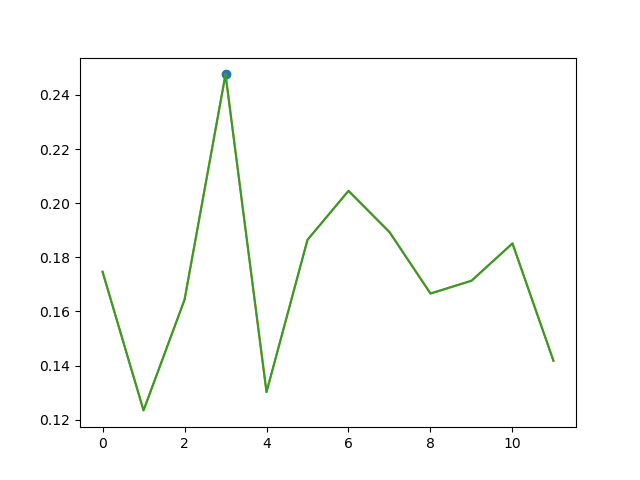

In [106]:
plt.figure()
i = days_start + 3
plt.plot(i-days_start,np.sum(mean_tp[24*i:24*(i+1)]), 'o')
plt.plot(daily_cumulative_tp[days_start:days_start+12])
plt.plot(daily_cumulative_tp[days_start:days_end].reshape(-1, 12)[0])

In [48]:
days[-5], df_datetimes[-1]

(datetime.datetime(2024, 5, 27, 0, 0), Timestamp('2024-05-27 00:00:00'))

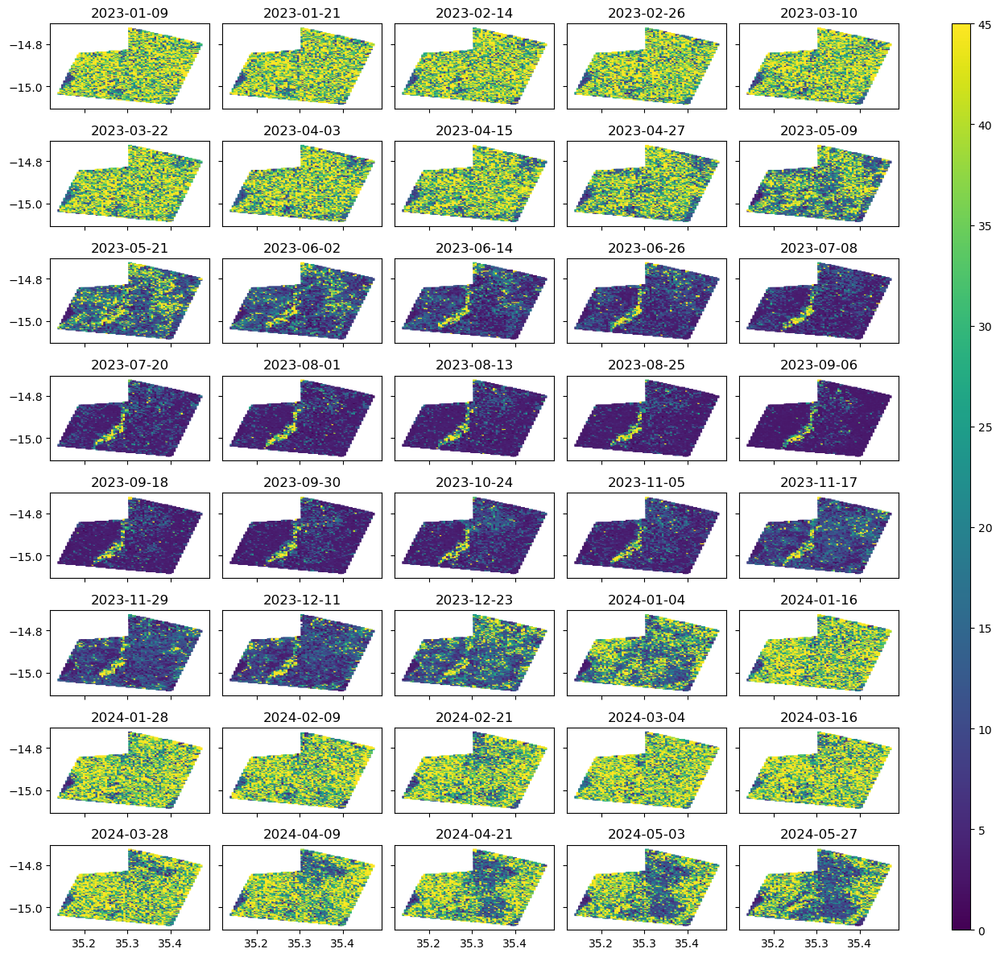

In [12]:
from matplotlib.colors import Normalize
import matplotlib.cm as cm
import datetime
cmap = cm.get_cmap('viridis')
normalizer = Normalize(0, 45)
im = cm.ScalarMappable(norm=normalizer)

fig, axs = plt.subplots(8,5, figsize=(14, 12), sharex=True, sharey=True)
for i, ax in enumerate(np.ravel(axs)):
    col = gdf.columns[1+i]
    gdf.plot(ax=ax, column = col, legend=False, cmap=cmap, norm=normalizer, aspect=None)
    col_date = datetime.datetime.strptime(col, "D%Y%m%d")
    ax.set_title(col_date.date())
plt.tight_layout()
fig.colorbar(im, ax=axs.ravel().tolist(), aspect=50)
# plt.savefig(ssm_path/"all_date_compare.png")

In [39]:
year_on_year = gdf[gdf.columns[30:]].values  - gdf[gdf.columns[1:12]].values




In [40]:
year_on_year_col_names = [d24 + '-' + d23 for d23, d24 in zip(gdf.columns[1:12], gdf.columns[30:])]
year_on_year_dict = {col_name: value for col_name, value in zip(year_on_year_col_names, year_on_year.T)}
year_on_year_df = pd.DataFrame(year_on_year_dict)
year_on_year_gdf = pd.concat([polys, year_on_year_df], axis=1)
# plt.figure()
# year_on_year_gdf.plot(year_on_year_col_names[0], cmap="PuOr", legend=True)

Text(0.02, 0.5, 'latitude')

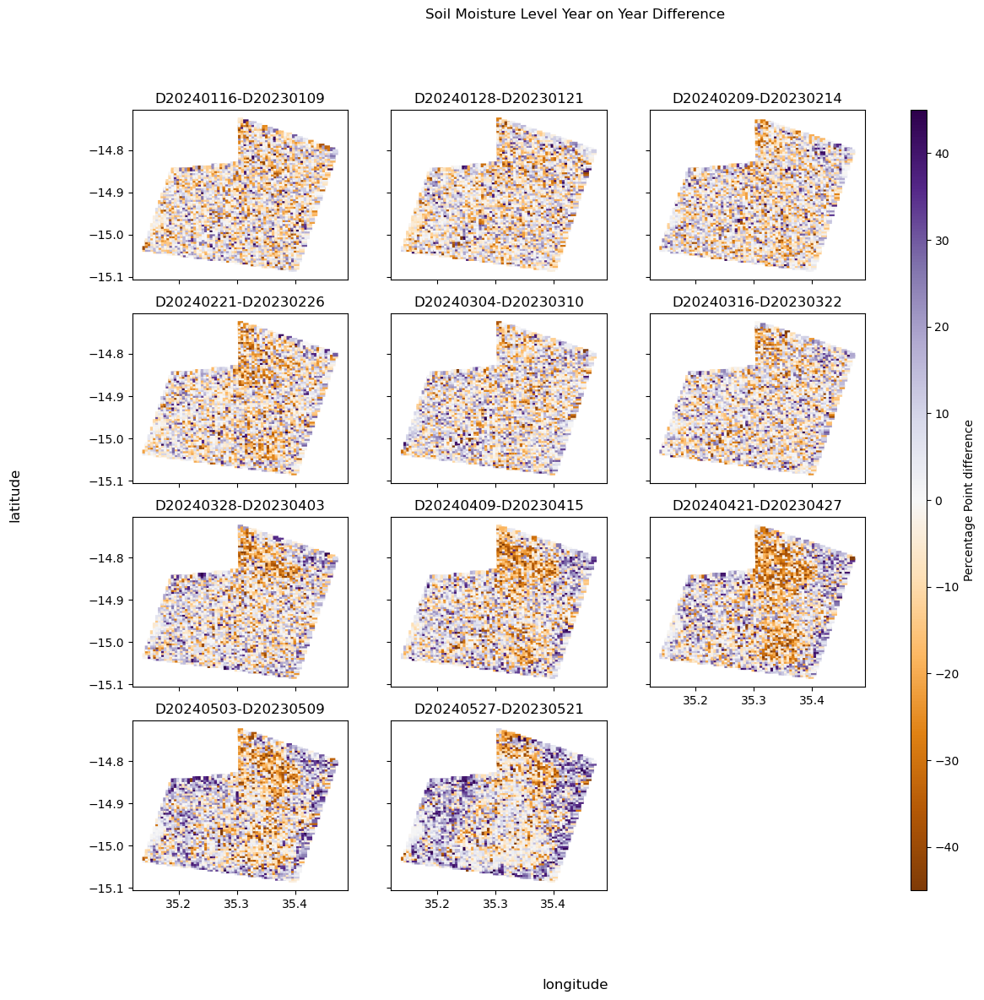

In [19]:
cmap = cm.get_cmap('PuOr')
normalizer = Normalize(-45, 45)
im = cm.ScalarMappable(norm=normalizer, cmap=cmap)

fig, axs = plt.subplots(4,3, figsize=(14, 12), sharex=True, sharey=True)
for i, ax in enumerate(np.ravel(axs)[:-1]):
    col = year_on_year_gdf.columns[1+i]
    year_on_year_gdf.plot(ax=ax, column = col, legend=False, cmap=cmap, norm=normalizer, aspect=None)
    # col_date = datetime.datetime.strptime(col, "D%Y%m%d")
    ax.set_title(col)
# plt.tight_layout()
axs[-1,-1].set_visible(False)
axs[2,-1].xaxis.set_tick_params(labelbottom=True)
fig.colorbar(im, ax=axs.ravel().tolist(), aspect=50, label="Percentage Point difference")
fig.suptitle("Soil Moisture Level Year on Year Difference")
fig.supxlabel("longitude")
fig.supylabel("latitude")
# fig.tight_layout()
# plt.savefig(ssm_path/"year_on_year_compare.png")


In [70]:
year_on_year_col_names

['D20240116-D20230109',
 'D20240128-D20230121',
 'D20240209-D20230214',
 'D20240221-D20230226',
 'D20240304-D20230310',
 'D20240316-D20230322',
 'D20240328-D20230403',
 'D20240409-D20230415',
 'D20240421-D20230427',
 'D20240503-D20230509',
 'D20240527-D20230521']

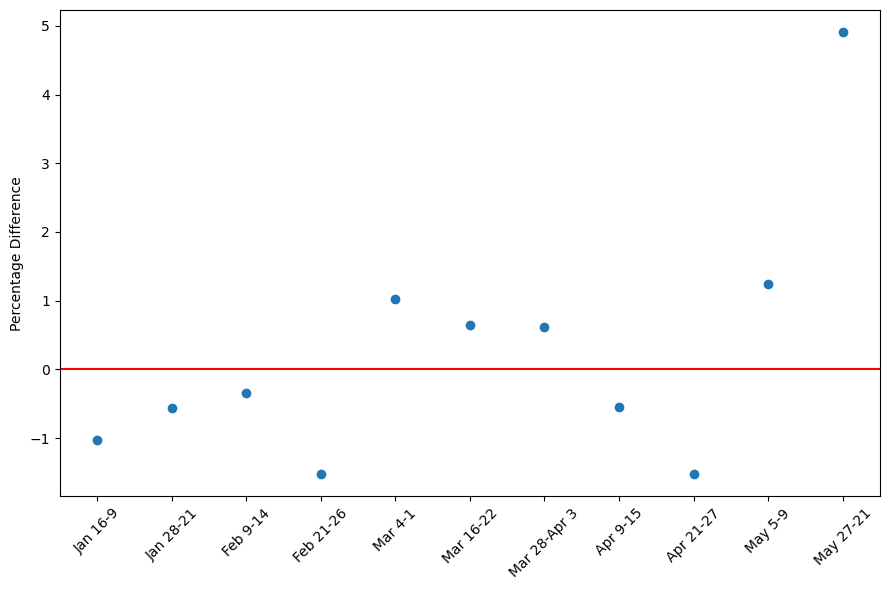

In [45]:
plt.figure(figsize=(9,6))
plt.plot(["Jan 16-9", "Jan 28-21","Feb 9-14", "Feb 21-26", "Mar 4-1", "Mar 16-22", "Mar 28-Apr 3", "Apr 9-15", "Apr 21-27", "May 5-9", "May 27-21"],
    year_on_year_gdf.mean(numeric_only=True).values, 'o')
plt.axhline(0, color='red')
plt.axvline(5, color='grey')
plt.xticks(rotation=45)
plt.ylabel("Percentage Difference")
plt.tight_layout()
plt.savefig(ssm_path/"mean_year_on_year_diff.png")


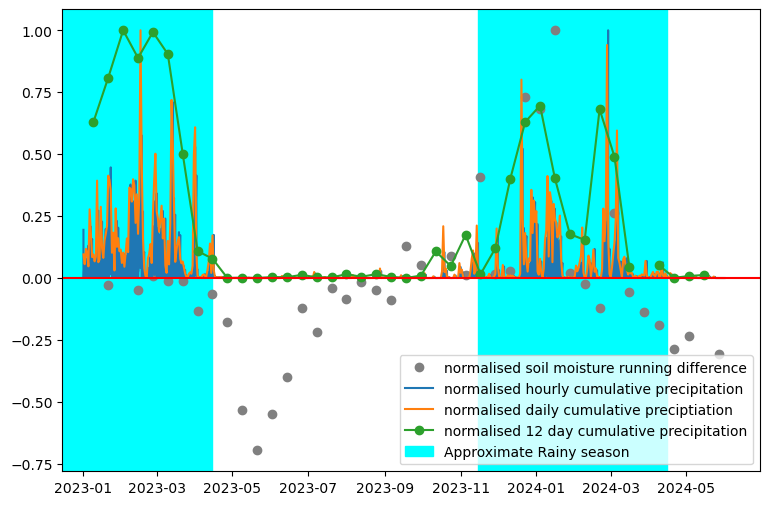

In [37]:

mean_rd = RD_gdf.mean(numeric_only=True).values
fig, ax = plt.subplots(figsize=(9,6))
slc_dates = [datetime.strptime(col, "D%Y%m%d") for col in gdf.columns[2:]]
ax.plot(slc_dates, mean_rd/np.nanmax(mean_rd), 'o', color='grey', label="normalised soil moisture running difference")
# slc_dates = [datetime.strptime(col, "D%Y%m%d") for col in gdf.columns[1:]]
# plt.plot(slc_dates,np.gradient(gdf.mean(numeric_only=True).values), 'o'

ax.plot(
    meteo_df.index,
    mean_tp/np.nanmax(mean_tp),
    label="normalised hourly cumulative precipitation")
ax.plot(
    days,
    daily_cumulative_tp/np.nanmax(daily_cumulative_tp),
    label="normalised daily cumulative preciptiation")
ax.plot(
    days[days_start:days_end][::12],
    revisit_cumulitave_tp/np.nanmax(revisit_cumulitave_tp),
    'o-',
    label="normalised 12 day cumulative precipitation")
ax.axhline(0, color='red')
rainy_start1 = datetime(2022,11,15)
rainy_end1 = datetime(2023,4,15)
rainy_start2 = datetime(2023,11,15)
rainy_end2 = datetime(2024,4,15)
ax.axvspan(rainy_start1, rainy_end1, color="aqua")
ax.axvspan(rainy_start2, rainy_end2, color="aqua", label="Approximate Rainy season")
ax.set_xlim(datetime(2022,12,15))

ax.legend()
plt.savefig(ssm_path/"mean_running_diff.png")




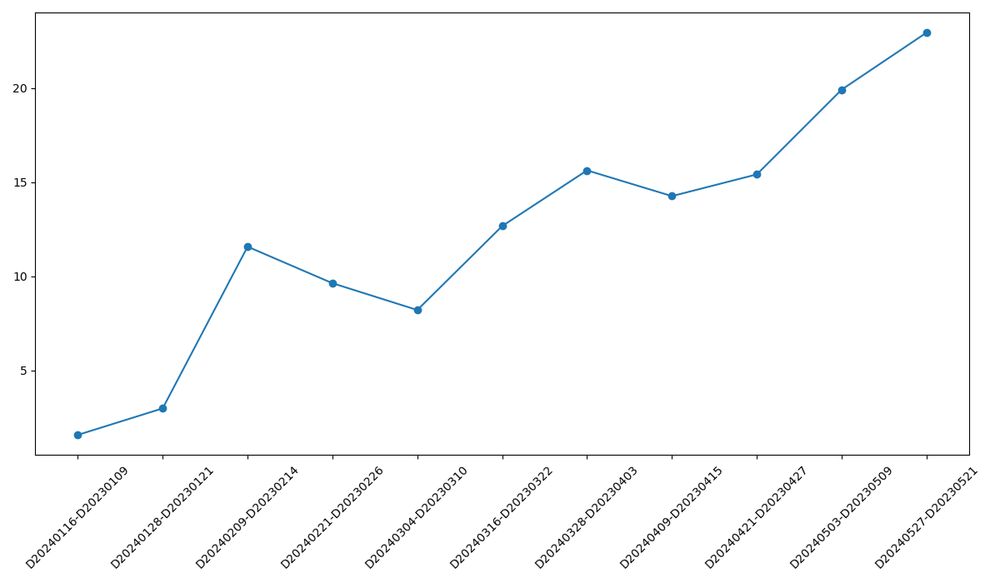

In [273]:
SSM_mean_year_on_year = SSM_mean[gdf.columns[30:]].values - SSM_mean[gdf.columns[1:12]].values
plt.figure(figsize=(12,7))
plt.plot(year_on_year_col_names, SSM_mean_year_on_year, 'o-')
plt.xticks(rotation=45)
plt.tight_layout()

In [297]:
import ee

# Trigger the authentication flow.
ee.Authenticate()

# Initialize the library.
ee.Initialize(project='ee-pearsemurphy04')



Successfully saved authorization token.


In [313]:
im_col = ee.Image("projects/ee-pearsemurphy04/assets/sand2")

In [314]:
im_col

NoneType

# Define AOI

In [23]:
half_malawi_poly_coords_str = "33.3833 -14.2069,33.3863 -14.231,33.4492 -14.3298,33.4515 -14.3631,33.4752 -14.401,33.5262 -14.4159,33.5641 -14.4756,33.5973 -14.4767,33.6175 -14.5134,33.6269 -14.5639,33.6388 -14.5846,33.6743 -14.6144,33.6909 -14.5949,33.7123 -14.5731,33.7052 -14.541,33.7111 -14.5066,33.7383 -14.4962,33.768 -14.5284,33.8106 -14.5479,33.8557 -14.51,33.8782 -14.5203,33.8806 -14.4997,33.9114 -14.4756,33.9268 -14.4836,33.9327 -14.4664,33.9443 -14.4785,34.083 -14.4889,34.0794 -14.459,34.1897 -14.4366,34.2101 -14.4408,34.2232 -14.4225,34.2639 -14.4281,34.2829 -14.4027,34.3134 -14.3999,34.3411 -14.3985,34.3542 -14.3858,34.3847 -14.3915,34.4066 -14.4098,34.6787 -14.4478,34.6859 -14.2253,34.6366 -14.1959,34.5796 -14.1443,34.4998 -13.9785,34.5644 -13.9306,34.591 -13.868,34.5872 -13.82,34.6062 -13.7684,34.6062 -13.7094,33.5542 -13.462,33.3833 -14.2069"

In [24]:
frame_640_footprint_coords_str = "35.463516 -15.600194,33.153385 -15.064587,33.551491 -13.446817,35.843384 -13.975264" #33.4904 -13.6951,33.1996 -14.9259,35.4748 -15.4809,35.7803 -14.2012,33.4904 -13.6951" #"33.5 -13.4,33.1 -15.0,35.4 -15.5,35.8 -13.9,33.5 -13.4"
frame_640_footprint1_coords_str = "-13.446817 33.551491,-15.064587 33.153385,-15.600194 35.463516,-13.975264 35.843384,-13.446817 33.551491"
# frame640_bbox =  "33.49 -13.5,33.49 -14.27, "
# 33.4904 -13.6951,33.1996 -14.9259,35.4748 -15.4809,35.7803 -14.2012,33.4904 -13.6951
# 33.49400806, -14.27191934 35.82715848, -13.50488602



In [25]:
bowtie_poly_coords_str = "33.6268 -13.5492,33.4318 -14.2245,33.6593 -14.5393,34.4004 -14.3693,34.6149 -15.2931,35.3949 -15.4999,35.629 -14.6274,34.5499 -14.2812,34.3289 -13.7893,33.6268 -13.5492"

In [26]:
# southern_malawi_poly_coords_str = "34.761 -15.3882,35.3946 -15.5356,35.5257 -15.0298,34.8775 -14.9102,34.761 -15.3882"
southern_malawi_poly_coords_str = "35.1398 -15.037,35.4017 -15.0851,35.4723 -14.7994,35.3422 -14.7404,35.302 -14.7249,35.3069 -14.8289,35.188 -14.846,35.1398 -15.037"

In [27]:
poly_coords_str = "33.5559 -13.4529,33.3617 -14.2337,33.4671 -14.4122,33.5228 -14.4307,33.5439 -14.4642,33.5995 -14.5087,33.6129 -14.5626,33.6091 -14.5904,33.6704 -14.6368,33.728 -14.5923,33.7261 -14.5087,33.7989 -14.5589,33.8431 -14.5514,33.9466 -14.4902,34.0962 -14.492,34.1058 -14.466,34.2324 -14.4512,34.2899 -14.427,34.3417 -14.4047,34.3974 -14.4177,34.43 -14.492,34.5067 -14.5681,34.5354 -14.6368,34.5048 -14.6906,34.5642 -14.8112,34.5554 -14.8796,34.5497 -14.8963,34.5631 -14.9371,34.6091 -14.9927,34.5823 -15.0427,34.5573 -15.0686,34.5688 -15.0964,34.5631 -15.1908,34.5899 -15.2371,34.5899 -15.2722,34.5554 -15.3074,34.4979 -15.3629,35.4478 -15.5771,35.824 -13.9839,35.0733 -13.8071,35.1244 -14.0053,35.1635 -14.0797,35.1788 -14.1638,35.2095 -14.2051,35.2129 -14.2513,35.2401 -14.2859,35.2776 -14.3651,35.2367 -14.4014,35.1533 -14.3041,35.0937 -14.2134,35.0529 -14.177,34.995 -14.1539,34.9439 -14.149,34.9346 -14.0858,34.9192 -14.0433,34.8737 -14.0053,34.8375 -13.9678,34.8146 -13.9645,34.7992 -14.0161,34.8205 -14.0454,34.8316 -14.0627,34.8431 -14.073,34.849 -14.0908,34.8495 -14.1007,34.8601 -14.111,34.8541 -14.1127,34.8261 -14.1168,34.8252 -14.1284,34.8048 -14.1473,34.8065 -14.1713,34.8049 -14.1916,34.8144 -14.1916,34.8139 -14.2173,34.8027 -14.2328,34.7927 -14.2611,34.7284 -14.2781,34.7167 -14.2848,34.6922 -14.2858,34.6843 -14.2807,34.6912 -14.273,34.6949 -14.2637,34.6938 -14.2513,34.6917 -14.2297,34.6731 -14.2266,34.645 -14.2179,34.6285 -14.2081,34.6062 -14.1854,34.6051 -14.1756,34.6062 -14.1602,34.5972 -14.1509,34.5849 -14.1401,34.5669 -14.1344,34.5685 -14.1282,34.5621 -14.119,34.5483 -14.0963,34.5525 -14.0829,34.544 -14.0695,34.5339 -14.0489,34.5361 -14.0319,34.5307 -14.0138,34.5185 -13.9741,34.5292 -13.9515,34.543 -13.9427,34.5669 -13.9241,34.577 -13.9133,34.586 -13.8947,34.5993 -13.8767,34.5918 -13.8695,34.595 -13.8571,34.5855 -13.8287,34.6221 -13.7766,34.6131 -13.772,34.6067 -13.7596,34.6099 -13.7472,34.6189 -13.7338,34.6285 -13.7188,34.629 -13.71,34.612 -13.709,34.6067 -13.6971,34.5934 -13.6894,33.5559 -13.4529"

In [28]:
poly_coords = [[float(lat), float(lon)] for lat, lon in [coord.split(' ') for coord in poly_coords_str.split(',')]]
half_malawi_poly_coords = [[float(lat), float(lon)] for lat, lon in [coord.split(' ') for coord in half_malawi_poly_coords_str.split(',')]]
southern_malawi_poly_coords = [[float(lat), float(lon)] for lat, lon in [coord.split(' ') for coord in southern_malawi_poly_coords_str.split(',')]]
frame_640_footprint_coords = [[float(lat), float(lon)] for lat, lon in [coord.split(' ') for coord in frame_640_footprint_coords_str.split(',')]]
frame_640_footprint1_coords = [[float(lat), float(lon)] for lon, lat in [coord.split(' ') for coord in frame_640_footprint1_coords_str.split(',')]]
bowtie_poly_coords = [[float(lat), float(lon)] for lat, lon in [coord.split(' ') for coord in bowtie_poly_coords_str.split(',')]]


In [29]:
from shapely.geometry import Polygon, LineString
poly = Polygon(poly_coords)
half_malawi_poly = Polygon(half_malawi_poly_coords)
southern_malawi_poly = Polygon(southern_malawi_poly_coords)
bowtie_poly = Polygon(bowtie_poly_coords)
frame_640_footprint = Polygon(frame_640_footprint_coords)
frame_640_footprint1 = Polygon(frame_640_footprint1_coords)
vertical_divider = LineString([(34.675,-15.5771), (34.675, -13.4529)])
horizontal_divider = LineString([(33.3617,-14.4), (35.824, -14.4)])

SyntaxError: invalid syntax (3446133011.py, line 1)

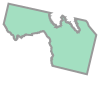

In [15]:
overlap = (frame_640_footprint & mpoly)
overlap

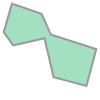

In [77]:
bowtie_poly

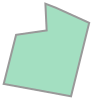

In [183]:
southern_malawi_poly

In [38]:
x,y = overlap[0].exterior.coords.xy

/tmp/ipykernel_3424103/1551732520.py:1: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  x,y = overlap[0].exterior.coords.xy


In [44]:
np.max(x), np.min(x), np.max(y), np.min(y)

(35.666884380474684, 33.309605, -13.4, -15.5)

In [16]:
overlap.bounds

(33.36849203527055, -15.4809, 35.71225690835484, -13.6951)

In [7]:
southern_malawi_poly.bounds

(35.1398, -15.0851, 35.4723, -14.7249)

In [39]:
from geojson import Feature, FeatureCollection, dump

In [40]:
features = []
features.append(Feature(geometry=frame_640_footprint))
feature_collection = FeatureCollection(features)

In [41]:
import json

with open("/data/tapas/pearse/malawi/sentinel1/aoi/frame_640_approx_footprint.geojson", "w") as gj:
    dump(feature_collection, gj)


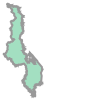

In [82]:
mpoly

In [1]:
frame_640_footprint1


NameError: name 'frame_640_footprint1' is not defined

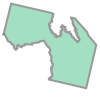

In [81]:
mpoly & frame_640_footprint1


In [12]:
poly.centroid.xy, poly.bounds

((array('d', [34.67494756891576]), array('d', [-14.437195933145023])),
 (33.3617, -15.5771, 35.824, -13.4529))

In [48]:
from shapely.ops import split
malawi_left, malawi_right = split(poly, vertical_divider)
# malawi_bottom_left, malawi_top_left = split(malawi_left, horizontal_divider)
# malawi_bottom_right, malawi_top_right = split(malawi_right, horizontal_divider)

/tmp/ipykernel_3023701/3917953993.py:2: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  malawi_left, malawi_right = split(poly, vertical_divider)


/tmp/ipykernel_23322/3665273520.py:1: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  malawi_bottom_left, malawi_top_left = split(malawi_left, horizontal_divider)


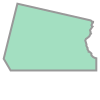

In [67]:
malawi_bottom_left, malawi_top_left = split(malawi_left, horizontal_divider)
malawi_top_left

In [81]:
malawi_top_left.bounds

(33.3617, -14.4, 34.675, -13.4529)

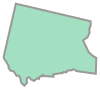

In [20]:
malawi_below_14 = malawi.intersection(bounding_box_below_14, ee.ErrorMargin(1))

In [199]:
json_data = {
  "type": "FeatureCollection",
  "features": [
    {
    "type": "Feature",
    "geometry": {
        "type": "Polygon",
        "coordinates": poly_coords
    },
    "properties": {
        "name": "Malawi_frame_640"
    }
    }
  ]
}

In [42]:
import geojson
with open("/data/tapas/pearse/malawi/sentinel1/aoi/geoBoundaries-MWI-ADM0.geojson") as gj:
    mpoly = geojson.load(gj)

    

In [24]:
from shapely.geometry import Polygon, MultiPolygon

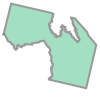

In [38]:
mpoly & frame_640_footprint

In [43]:
mpoly.bounds

(32.670362, -17.129522, 35.918573, -9.368326)

In [34]:
mpoly = Polygon(mpoly['features'][0]['geometry']['coordinates'][2][0])
mpoly

TypeError: 'Polygon' object is not subscriptable

/data/tapas/pearse/miniconda3/envs/insar4sm_dev/lib/python3.9/site-packages/rioxarray/_io.py:1132: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))  # type: ignore
/data/tapas/pearse/miniconda3/envs/insar4sm_dev/lib/python3.9/site-packages/rioxarray/_io.py:1132: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))  # type: ignore
/data/tapas/pearse/miniconda3/envs/insar4sm_dev/lib/python3.9/site-packages/rioxarray/_io.py:1132: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))  # type: ignore
/data/tapas/pearse/miniconda3/envs/insar4sm_dev/lib/python3.9/site-packages/rioxarray/_io.py:1132: NotGeoreferencedWarning: Dataset has no geo

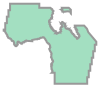

In [6]:
burst_edges = []
for IW in ["IW1", "IW2", "IW3"]:
    
    burst_lats = sorted(Path(f"/data/tapas/pearse/malawi/sentinel1/stack_full_frame/geom_reference/{IW}/").glob("lat_*rdr.vrt"))
    burst_lons = sorted(Path(f"/data/tapas/pearse/malawi/sentinel1/stack_full_frame/geom_reference/{IW}/").glob("lon_*rdr.vrt"))

    for fp, (blat, blon) in enumerate(zip(burst_lats, burst_lons)):
        blat_da = rxr.open_rasterio(blat, parse_coordinates=False)
        blon_da = rxr.open_rasterio(blon, parse_coordinates=False)
        # Counter clockwise from top left
        burst_edge = [
            (blon_da.values.min() + 0.025, blat_da.values.max() - 0.025),
            (blon_da.values.min() + 0.025, blat_da.values.min() + 0.025),
            (blon_da.values.max() - 0.025, blat_da.values.min() + 0.025),
            (blon_da.values.max() - 0.025, blat_da.values.max() - 0.025),
            (blon_da.values.min() + 0.025, blat_da.values.max() - 0.025),]
        burst_poly = Polygon(burst_edge)
        features = []
        features.append(Feature(geometry=burst_poly))
        feature_collection = FeatureCollection(features)
        with open(f"/data/tapas/pearse/malawi/sentinel1/aoi/Malawi_swath_{IW}_footprint_{fp}.geojson", "w") as gj:
            dump(feature_collection, gj)
        burst_edges.append(burst_poly)
footprint = MultiPolygon(burst_edges)

geom_union = footprint.geoms[1]
for i in range(2, len(footprint.geoms)-1):
    geom_union = geom_union.union(footprint.geoms[i])
overlap = geom_union & mpoly
overlap

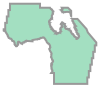

In [33]:

overlap = geom_union & mpoly
overlap

In [61]:
from geojson import Feature, FeatureCollection, dump

In [70]:
features = []
features.append(Feature(geometry=small_overlap))
feature_collection = FeatureCollection(features)

In [71]:
import json

with open("/data/tapas/pearse/malawi/sentinel1/aoi/Malawi_small_footprint.geojson", "w") as gj:
    dump(feature_collection, gj)


In [68]:
with open("/data/tapas/pearse/malawi/sentinel1/aoi/footprint_small.geojson") as gj:
    footprint_small = geojson.load(gj)
footprint_small = Polygon(footprint_small['features'][0]['geometry']['coordinates'][0])
small_overlap = footprint_small & mpoly

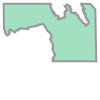

In [69]:
small_overlap


# Download soilgrid data

In [ ]:
from owslib.wcs import WebCoverageService

In [ ]:
sand_wcs = WebCoverageService("https://maps.isric.org/mapserv?map=/map/sand.map")

In [195]:
sand_wcs.contents.keys()

dict_keys(['sand_0-5cm_Q0.05', 'sand_0-5cm_Q0.5', 'sand_0-5cm_Q0.95', 'sand_0-5cm_mean', 'sand_0-5cm_uncertainty', 'sand_5-15cm_Q0.5', 'sand_5-15cm_Q0.05', 'sand_5-15cm_Q0.95', 'sand_5-15cm_mean', 'sand_5-15cm_uncertainty', 'sand_15-30cm_Q0.5', 'sand_15-30cm_Q0.05', 'sand_15-30cm_Q0.95', 'sand_15-30cm_mean', 'sand_15-30cm_uncertainty', 'sand_30-60cm_Q0.05', 'sand_30-60cm_Q0.5', 'sand_30-60cm_Q0.95', 'sand_30-60cm_mean', 'sand_30-60cm_uncertainty', 'sand_60-100cm_Q0.5', 'sand_60-100cm_Q0.05', 'sand_60-100cm_Q0.95', 'sand_60-100cm_mean', 'sand_60-100cm_uncertainty', 'sand_100-200cm_Q0.05', 'sand_100-200cm_Q0.5', 'sand_100-200cm_Q0.95', 'sand_100-200cm_mean', 'sand_100-200cm_uncertainty'])

In [33]:
desc_cover = sand_wcs.getDescribeCoverage('sand_0-5cm_mean')

In [50]:
sand = sand_wcs.contents['sand_0-5cm_mean']
crs = "http://www.opengis.net/def/crs/EPSG/0/152160"

In [60]:
poly.bounds

(33.3617, -15.5771, 35.824, -13.4529)

In [145]:
import utm
lon1, lat1, lon2, lat2 = np.round(poly.bounds).astype(int)
E,N, ZN, ZL =utm.from_latlon(np.array([lat1, lat2]), np.array([lon1, lon2]))
E,N, ZN, ZL

(array([500000.        , 825458.66949595]),
 array([8231064.62403996, 8560946.29585334]),
 36,
 'L')

In [179]:
def get_soil_layers(poly, res=250):
    lon1, lat1, lon2, lat2 = np.round(poly.bounds).astype(int)
    subsets = [('lat', lat1, lat2), ('long', lon1, lon2)]
    for soil_type in ['sand', 'clay']:
        soil_wcs = WebCoverageService(f"https://maps.isric.org/mapserv?map=/map/{soil_type}.map")
        soil = soil_wcs.contents[f'{soil_type}_0-5cm_mean']
        response = soil_wcs.getCoverage(
            identifier=[soil.id],
            SUBSETTINGCRS="http://www.opengis.net/def/crs/EPSG/0/4326",
            OUTPUTCRS="http://www.opengis.net/def/crs/EPSG/0/4326",
            subsets=subsets,
            resx=res,
            resy=res,
            format=soil.supportedFormats[0])
        with open(f'malawi/SSM/soilgrids/{soil_type}_{res}.tif', 'wb') as file:
            file.write(response.read())


In [190]:
get_soil_layers(poly, 250)

In [171]:
sand_wcs

In [ ]:
https://maps.isric.org/mapserv?map=/map/sand.map&SERVICE=WCS&VERSION=2.0.1&REQUEST=GetCoverage&COVERAGEID=sand_0-5cm_mean&FORMAT=image/tiff&SUBSET=long(0,2)&SUBSET=lat(0,2)&SUBSETTINGCRS=http://www.opengis.net/def/crs/EPSG/0/4326&OUTPUTCRS=http://www.opengis.net/def/crs/EPSG/0/4326

In [ ]:
https://maps.isric.org/mapserv?map=/map/clay.map&SERVICE=WCS&VERSION=2.0.1&REQUEST=GetCoverage&COVERAGEID=clay_0-5cm_mean&FORMAT=image/tiff&SUBSET=long(0,2)&SUBSET=lat(0,2)&SUBSETTINGCRS=http://www.opengis.net/def/crs/EPSG/0/4326&OUTPUTCRS=http://www.opengis.net/def/crs/EPSG/0/4326

In [149]:
subsets = [('lat', lat1, lat2), ('long', lon1, lon2)]
subsets

[('lat', -16, -13), ('long', 33, 36)]

In [166]:
response = sand_wcs.getCoverage(identifier=[sand.id], SUBSETTINGCRS="http://www.opengis.net/def/crs/EPSG/0/4326", OUTPUTCRS="http://www.opengis.net/def/crs/EPSG/0/4326", subsets=subsets, resx=250, resy=250, format=sand.supportedFormats[0])

In [167]:
response.geturl()

'https://maps.isric.org/mapserv?map=/map/sand.map&amp;&version=2.0.1&request=GetCoverage&service=WCS&CoverageID=sand_0-5cm_mean&format=image%2Ftiff&SUBSETTINGCRS=http%3A%2F%2Fwww.opengis.net%2Fdef%2Fcrs%2FEPSG%2F0%2F4326&OUTPUTCRS=http%3A%2F%2Fwww.opengis.net%2Fdef%2Fcrs%2FEPSG%2F0%2F4326&subset=lat%28-16%2C-13%29&subset=long%2833%2C36%29'

In [168]:
with open('malawi/SSM/soilgrids/sand_large.tif', 'wb') as file:
    file.write(response.read())

In [135]:
sand_rio.read(1).shape, clay_rio.read(1).shape

((2902, 7962), (14509, 39812))

: 

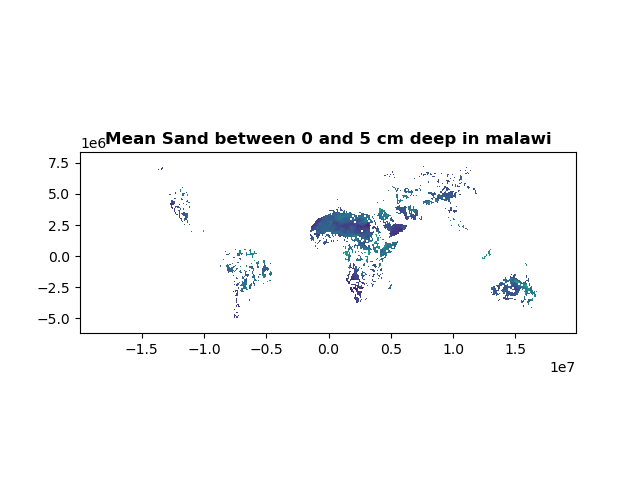

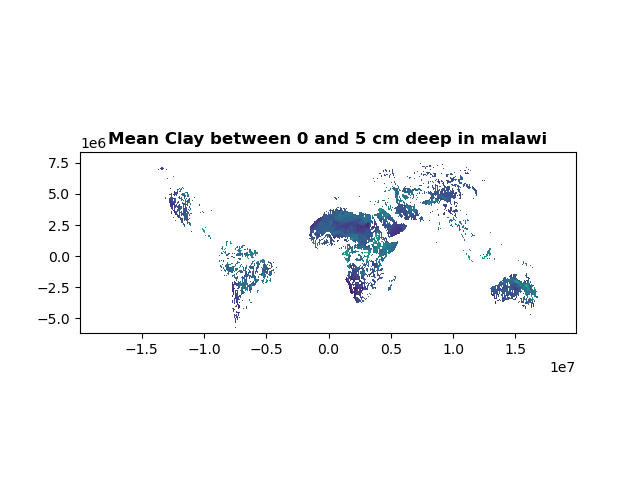

<AxesSubplot:title={'center':'Mean Clay between 0 and 5 cm deep in malawi'}>

In [1]:
import rasterio
from rasterio import plot
%matplotlib widget
sand_rio = rasterio.open("malawi/SSM/soilgrids/clay_0-5cm_mean_5000.tif", driver="GTiff")
plot.show(sand_rio, title='Mean Sand between 0 and 5 cm deep in malawi', cmap='viridis')
clay_rio = rasterio.open("malawi/SSM/soilgrids/clay_0-5cm_mean_1000.tif", driver="GTiff")
plot.show(clay_rio, title='Mean Clay between 0 and 5 cm deep in malawi', cmap='viridis')

In [83]:
import os
from osgeo import gdal
merged_dir = "/data/tapas/pearse/malawi/sentinel1/stack_full_frame/merged"

In [84]:
latFile = os.path.join(merged_dir, "geom_reference", "lat.rdr.full.vrt")
lonFile = os.path.join(merged_dir, "geom_reference", "lon.rdr.full.vrt")

lat_data = gdal.Open(latFile).ReadAsArray()
lon_data = gdal.Open(lonFile).ReadAsArray()

In [105]:
np.min(lat_data), np.max(lat_data[lat_data!=0])

(-15.602457714134458, -13.504886016788177)

In [107]:
np.min(lon_data[lon_data!=0]), np.max(lon_data)

(33.17134746860198, 35.827158478366414)

: 